# Trabajo Final UNSA Maestria Ciencias de la Computación - Betzy Yarin Ramirez

Participante de Maestria: Betzy Jacqueline Yarin Ramirez

# 1) Librerias

In [ ]:
!pip install umap-learn -q
!pip install geopandas -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 2.8 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import seaborn as sns
import numpy as np
import geopandas as gpd
import math
import folium
from folium.plugins import HeatMap
pd.set_option('display.max_columns', None)
from statsmodels.tsa.api import ExponentialSmoothing
from wordcloud import WordCloud
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.manifold import TSNE
from sklearn.feature_selection import SelectKBest, chi2, f_classif, mutual_info_classif, RFE
from sklearn.linear_model import LogisticRegression, Lasso
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.ensemble import ExtraTreesClassifier
import umap
from collections import Counter

import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# 2) Data Mortalidad

| Nombre Original    | Traducción en Español                             |
|--------------------|---------------------------------------------------|
| CODMUNRES_6        | Código del municipio de residencia (formato de 6 dígitos) |
| CODMUNRES_7        | Código del municipio de residencia (formato de 7 dígitos) |
| ESTADORES          | Estado de residencia                              |
| NOMEMUNRES         | Nombre del municipio de residencia                |
| CODMUNOCOR         | Código del municipio de ocurrencia                |
| ANORES             | Año de registro                                   |
| MESRES             | Mes de registro                                   |
| SEXO               | Sexo                                              |
| RACACOR            | Raza/Color                                        |
| ESCOLARIDADE       | Escolaridad                                       |
| CAUSABASICA        | Causa básica                                      |
| FAIXAIDADE         | Rango de edad                                     |
| LATITUDE           | Latitud                                           |
| LONGITUDE          | Longitud                                          |
| CASOSTOTAL         | Casos totales                                     |


In [ ]:
df = pd.read_csv('/content/Deaths_National_Malaria_database.csv', encoding='latin1')
df.columns = ['COD_MUNICIPIO_RES_6', 'COD_MUNICIPIO_RES_7', 'ESTADO_RESIDENCIA', 'NOMBRE_MUNICIPIO_RESIDENCIA',
              'COD_MUNICIPIO_OCURRENCIA', 'ANIO_REGISTRO', 'MES_REGISTRO', 'SEXO', 'RAZA_COLOR', 'ESCOLARIDAD',
              'CAUSA_BASICA', 'RANGO_EDAD', 'LATITUD', 'LONGITUD', 'CASOS_TOTALES']

display(df.head(3))

,COD_MUNICIPIO_RES_6,COD_MUNICIPIO_RES_7,ESTADO_RESIDENCIA,NOMBRE_MUNICIPIO_RESIDENCIA,COD_MUNICIPIO_OCURRENCIA,ANIO_REGISTRO,MES_REGISTRO,SEXO,RAZA_COLOR,ESCOLARIDAD,CAUSA_BASICA,RANGO_EDAD,LATITUD,LONGITUD,CASOS_TOTALES
0,110006,1100064,"ROND?""NIA",COLORADO DO OESTE,1100205,2004,9,M,BRANCA,999,FALCIPARUM,FAIXA_65+,-13.117,-60.545,1
1,150580,1505809,PAR?,PORTEL,150580,2006,10,F,PARDA,999,FALCIPARUM,FAIXA_0-4,-1.936,-50.819,1
2,150670,1506708,PAR?,SANTANA DO ARAGUAIA,1506708,2003,4,M,PARDA,NENHUMA,FALCIPARUM,FAIXA_35-39,-9.328,-50.350,1


# 3) Data Clima

| Nombre de la columna           | Tipo de Dato | Descripción                                     |
|--------------------------------|--------------|-------------------------------------------------|
| `COD_MUNICIPIO_RES_7`                | Entero       | Código del municipio                            |
| `ANIO_REGISTRO`                          | Entero       | Año del registro                                |
| `MES_REGISTRO`                          | Entero       | Mes del registro                                |
| `TEMPERATURA`                          | Flotante     | Temperatura media del mes (°C)                |
| `HUMEDAD_RELATIVA`                         | Flotante     | Humedad relativa promedio del mes (%)           |


In [ ]:
df_clima = pd.read_csv('/content/Climate_database.csv')
df_clima.head(3)

,COD_MUNICIPIO_RES_7,ANIO_REGISTRO,MES_REGISTRO,TEMPERATURA,HUMEDAD_RELATIVA
0,1100064,2015,1,24.749,98.758
1,1100106,2005,1,25.070,97.258
2,1100130,2012,7,25.490,75.766


# 4) EDA

#  5) Transformacion Data Clima

## 1) Transformación Logarítmica Temperatura

In [ ]:
min_valor_no_negativo = df_clima.loc[df_clima['TEMPERATURA'] >= 0, 'TEMPERATURA'].min()

print(f"El valor mínimo no negativo de 'TEMPERATURA' es: {min_valor_no_negativo}\n")

filtro_df_temp = df_clima[df_clima['TEMPERATURA'] < min_valor_no_negativo]
porcentaje = (filtro_df_temp.shape[0] / df.shape[0]) * 100

print(f"La cantidad de TEMPERATURA menor que {min_valor_no_negativo} es: {filtro_df_temp.shape[0]}\n")
print(f"Esto representa el {porcentaje:.2f}% del total de registros.\n")
print(f"Datos unicos Temperatura Outlier: {filtro_df_temp['TEMPERATURA'].unique()}\n")

El valor mínimo no negativo de 'TEMPERATURA' es: 10.154

La cantidad de TEMPERATURA menor que 10.154 es: 1092

Esto representa el 110.30% del total de registros.

Datos unicos Temperatura Outlier: [-1.03230028e+09 -1.03122609e+09 -9.99000273e+08 -1.03467885e+09]



In [ ]:
df_clima.loc[filtro_df_temp.index, 'TEMPERATURA'] = filtro_df_temp['TEMPERATURA'].apply(
    lambda x: -np.log(-x) if x < 0 else np.log(x)
)

In [ ]:
min_valor_no_negativo = df_clima.loc[df_clima['TEMPERATURA'] >= 0, 'TEMPERATURA'].min()

print(f"El valor mínimo no negativo de 'TEMPERATURA' es: {min_valor_no_negativo}\n")

filtro_df_temp = df_clima[df_clima['TEMPERATURA'] < min_valor_no_negativo]
porcentaje = (filtro_df_temp.shape[0] / df.shape[0]) * 100

print(f"La cantidad de TEMPERATURA menor que {min_valor_no_negativo} es: {filtro_df_temp.shape[0]}\n")
print(f"Esto representa el {porcentaje:.2f}% del total de registros.\n")
print(f"Datos unicos Temperatura Outlier: {filtro_df_temp['TEMPERATURA'].unique()}\n")

El valor mínimo no negativo de 'TEMPERATURA' es: 10.154

La cantidad de TEMPERATURA menor que 10.154 es: 1092

Esto representa el 110.30% del total de registros.

Datos unicos Temperatura Outlier: [-20.75505543 -20.75401431 -20.72226561 -20.75735693]



## 2) Comparativa entre Data Mortalidad y Clima

In [ ]:
tabla_cod_municipio = df_clima.groupby('COD_MUNICIPIO_RES_7').size().reset_index(name='Cantidad_df')
tabla_cod_municipio_death = df.groupby('COD_MUNICIPIO_RES_7').size().reset_index(name='Cantidad_df_death')
tabla_comparativa = tabla_cod_municipio.merge(tabla_cod_municipio_death, on='COD_MUNICIPIO_RES_7', how='outer')
display(tabla_comparativa)

,COD_MUNICIPIO_RES_7,Cantidad_df,Cantidad_df_death
0,1100023,156,12
1,1100031,156,1
2,1100064,156,1
3,1100098,156,1
4,1100106,156,2
...,...,...,...
338,5218003,156,1
339,5218904,156,1
340,5220454,156,1
341,5221858,156,1


## 3) Conversion de atributos

### 3.1) Año y Mes

In [ ]:
df_clima['ANIO_MES'] = df_clima['ANIO_REGISTRO'] + df_clima['MES_REGISTRO'] / 12

### 3.2) Categoria Temperatura

In [ ]:
bins = [-float('inf'), 5, 10, 20, 30, float('inf')]
labels = ['Muy frio', 'Frio', 'Templado', 'Calido', 'Muy calido']

df_clima['CATEGORIA_TEMPERATURA'] = pd.cut(df_clima['TEMPERATURA'], bins=bins, labels=labels, right=True)

### 3.3) Categoria Humedad

In [ ]:
bins_humedad = [0, 50, 70, 85, 100, float('inf')]
labels_humedad = ['Muy baja', 'Baja', 'Moderada', 'Alta', 'Muy alta']

df_clima['CATEGORIA_HUMEDAD'] = pd.cut(df_clima['HUMEDAD_RELATIVA'], bins=bins_humedad, labels=labels_humedad, right=True)

## 4) Ordenar columnas categoricas

In [ ]:
df_clima['CATEGORIA_TEMPERATURA'] = pd.Categorical(df_clima['CATEGORIA_TEMPERATURA'], categories=['Muy frio', 'Frio', 'Templado', 'Calido', 'Muy calido'], ordered=True)
df_clima['CATEGORIA_HUMEDAD'] = pd.Categorical(df_clima['CATEGORIA_HUMEDAD'], categories=['Muy baja', 'Baja', 'Moderada', 'Alta', 'Muy alta'], ordered=True)

In [ ]:
df_clima['CATEGORIA_TEMPERATURA'].value_counts(sort=False)

CATEGORIA_TEMPERATURA
Muy frio       1092
Frio              0
Templado       3984
Calido        46823
Muy calido     1609
Name: count, dtype: int64

In [ ]:
df_clima['CATEGORIA_HUMEDAD'].value_counts(sort=False)

CATEGORIA_HUMEDAD
Muy baja     1964
Baja         4969
Moderada     8166
Alta        36845
Muy alta     1564
Name: count, dtype: int64

## 5) Combinacion de Data Mortalidad y Clima

In [ ]:
key_columns = ['COD_MUNICIPIO_RES_7', 'ANIO_REGISTRO', 'MES_REGISTRO']

df = pd.merge(df, df_clima[key_columns + ['ANIO_MES','TEMPERATURA', 'HUMEDAD_RELATIVA','CATEGORIA_TEMPERATURA','CATEGORIA_HUMEDAD']],
                     on=key_columns, how='left')

current_columns = list(df.columns)

current_columns.remove('CAUSA_BASICA')
current_columns.append('CAUSA_BASICA')

df = df[current_columns]

print(f"Número de registros en el DataFrame mergeado: {len(df)}")

Número de registros en el DataFrame mergeado: 990


In [ ]:
filtro_df = df_clima[(df_clima['COD_MUNICIPIO_RES_7'] == 1100064) &
               (df_clima['MES_REGISTRO'] == 9) &
               (df_clima['ANIO_REGISTRO'] == 2004)]

resultado_df = filtro_df[['TEMPERATURA', 'HUMEDAD_RELATIVA', 'CATEGORIA_TEMPERATURA', 'CATEGORIA_HUMEDAD']]
print("Resultados en df_clima:")
display(resultado_df)

filtro_merged_df = df[(df['COD_MUNICIPIO_RES_7'] == 1100064) &
                             (df['MES_REGISTRO'] == 9) &
                             (df['ANIO_REGISTRO'] == 2004)]

resultado_merged_df = filtro_merged_df[['TEMPERATURA', 'HUMEDAD_RELATIVA', 'CATEGORIA_TEMPERATURA', 'CATEGORIA_HUMEDAD']]
print("\nResultados en df:")
display(resultado_merged_df)

Resultados en df_clima:


,TEMPERATURA,HUMEDAD_RELATIVA,CATEGORIA_TEMPERATURA,CATEGORIA_HUMEDAD
10309,29.464,47.667,Calido,Muy baja



Resultados en df:


,TEMPERATURA,HUMEDAD_RELATIVA,CATEGORIA_TEMPERATURA,CATEGORIA_HUMEDAD
0,29.464,47.667,Calido,Muy baja


## 6) Datos Duplicados, Null

In [ ]:
resumen_estadistico = df_clima.describe(include='all')
print("Resumen estadístico del DataFrame:")
display(resumen_estadistico)

Resumen estadístico del DataFrame:


,COD_MUNICIPIO_RES_7,ANIO_REGISTRO,MES_REGISTRO,TEMPERATURA,HUMEDAD_RELATIVA,ANIO_MES,CATEGORIA_TEMPERATURA,CATEGORIA_HUMEDAD
count,53508.000,53508.000,53508.000,53508.000,53508.000,53508.000,53508,53508
unique,NaN,NaN,NaN,NaN,NaN,NaN,4,5
top,NaN,NaN,NaN,NaN,NaN,NaN,Calido,Alta
freq,NaN,NaN,NaN,NaN,NaN,NaN,46823,36845
mean,2469560.122,2009.000,6.500,23.760,87.235,2009.542,NaN,NaN
std,1317609.237,3.742,3.452,7.039,14.215,3.753,NaN,NaN
min,1100023.000,2003.000,1.000,-20.757,25.708,2003.083,NaN,NaN
25%,1400233.000,2006.000,3.750,23.512,82.874,2006.312,NaN,NaN
50%,2103000.000,2009.000,6.500,25.177,92.782,2009.542,NaN,NaN
75%,3306305.000,2012.000,9.250,26.104,96.927,2012.771,NaN,NaN


In [ ]:
grouped = df_clima.groupby(['COD_MUNICIPIO_RES_7', 'ANIO_REGISTRO']).size().unstack(fill_value=0)
grouped['Total'] = grouped.sum(axis=1)
total_row = grouped.sum()
total_row.name = 'Total'
grouped = pd.concat([grouped, total_row.to_frame().T])
display(grouped)

ANIO_REGISTRO,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,Total
1100023,12,12,12,12,12,12,12,12,12,12,12,12,12,156
1100031,12,12,12,12,12,12,12,12,12,12,12,12,12,156
1100064,12,12,12,12,12,12,12,12,12,12,12,12,12,156
1100098,12,12,12,12,12,12,12,12,12,12,12,12,12,156
1100106,12,12,12,12,12,12,12,12,12,12,12,12,12,156
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5218904,12,12,12,12,12,12,12,12,12,12,12,12,12,156
5220454,12,12,12,12,12,12,12,12,12,12,12,12,12,156
5221858,12,12,12,12,12,12,12,12,12,12,12,12,12,156
5300108,12,12,12,12,12,12,12,12,12,12,12,12,12,156


## 7) Estadistica Descriptiva

In [ ]:
df_clima.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53508 entries, 0 to 53507
Data columns (total 8 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   COD_MUNICIPIO_RES_7    53508 non-null  int64   
 1   ANIO_REGISTRO          53508 non-null  int64   
 2   MES_REGISTRO           53508 non-null  int64   
 3   TEMPERATURA            53508 non-null  float64 
 4   HUMEDAD_RELATIVA       53508 non-null  float64 
 5   ANIO_MES               53508 non-null  float64 
 6   CATEGORIA_TEMPERATURA  53508 non-null  category
 7   CATEGORIA_HUMEDAD      53508 non-null  category
dtypes: category(2), float64(3), int64(3)
memory usage: 2.6 MB


In [ ]:
df_clima['TEMPERATURA'].describe()

count   53508.000
mean       23.760
std         7.039
min       -20.757
25%        23.512
50%        25.177
75%        26.104
max        32.995
Name: TEMPERATURA, dtype: float64

In [ ]:
valores_nulos = df_clima.isnull().sum()
duplicados = df_clima.duplicated().sum()
print("Valores nulos en cada columna:")
print(valores_nulos)
print(f"\nFilas duplicadas: {duplicados}")

Valores nulos en cada columna:
COD_MUNICIPIO_RES_7      0
ANIO_REGISTRO            0
MES_REGISTRO             0
TEMPERATURA              0
HUMEDAD_RELATIVA         0
ANIO_MES                 0
CATEGORIA_TEMPERATURA    0
CATEGORIA_HUMEDAD        0
dtype: int64

Filas duplicadas: 0


#  6) Transformacion Data Mortalidad

In [ ]:
df.shape

(990, 20)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 990 entries, 0 to 989
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   COD_MUNICIPIO_RES_6          990 non-null    int64   
 1   COD_MUNICIPIO_RES_7          990 non-null    int64   
 2   ESTADO_RESIDENCIA            990 non-null    object  
 3   NOMBRE_MUNICIPIO_RESIDENCIA  990 non-null    object  
 4   COD_MUNICIPIO_OCURRENCIA     990 non-null    int64   
 5   ANIO_REGISTRO                990 non-null    int64   
 6   MES_REGISTRO                 990 non-null    int64   
 7   SEXO                         990 non-null    object  
 8   RAZA_COLOR                   990 non-null    object  
 9   ESCOLARIDAD                  990 non-null    object  
 10  RANGO_EDAD                   990 non-null    object  
 11  LATITUD                      990 non-null    float64 
 12  LONGITUD                     990 non-null    float64 
 13  CASOS

In [ ]:
df.nunique()

COD_MUNICIPIO_RES_6            343
COD_MUNICIPIO_RES_7            343
ESTADO_RESIDENCIA               27
NOMBRE_MUNICIPIO_RESIDENCIA    343
COD_MUNICIPIO_OCURRENCIA       296
ANIO_REGISTRO                   13
MES_REGISTRO                    12
SEXO                             3
RAZA_COLOR                       6
ESCOLARIDAD                      6
RANGO_EDAD                      15
LATITUD                        343
LONGITUD                       343
CASOS_TOTALES                    2
ANIO_MES                       155
TEMPERATURA                    802
HUMEDAD_RELATIVA               799
CATEGORIA_TEMPERATURA            4
CATEGORIA_HUMEDAD                5
CAUSA_BASICA                     4
dtype: int64

In [ ]:
df.describe()

,COD_MUNICIPIO_RES_6,COD_MUNICIPIO_RES_7,COD_MUNICIPIO_OCURRENCIA,ANIO_REGISTRO,MES_REGISTRO,LATITUD,LONGITUD,CASOS_TOTALES,ANIO_MES,TEMPERATURA,HUMEDAD_RELATIVA
count,990.000,990.000,990.000,990.000,990.000,990.000,990.000,990.000,990.000,990.000,990.000
mean,192130.175,1921305.855,718148.408,2007.760,6.339,-7.099,-56.106,1.001,2008.288,24.757,89.104
std,113347.315,1133473.516,935053.331,3.447,3.374,6.861,8.693,0.032,3.468,5.301,12.577
min,110002.000,1100023.000,110002.000,2003.000,1.000,-30.032,-72.900,1.000,2003.083,-20.755,32.089
25%,130153.750,1301543.000,130423.750,2005.000,3.000,-9.461,-63.032,1.000,2005.417,24.824,85.734
50%,150180.000,1501808.000,211130.000,2007.000,7.000,-4.882,-55.993,1.000,2007.667,25.615,93.988
75%,210256.250,2102566.250,1275174.000,2010.000,9.000,-3.119,-49.574,1.000,2010.979,26.150,97.565
max,530010.000,5300108.000,5300108.000,2015.000,12.000,4.603,-34.855,2.000,2016.000,31.616,102.202


In [ ]:
results = []

for col in df.select_dtypes(include='object').columns:
    results.append({
        'Nombre': col,
        'Cantidad': df[col].nunique(),
        'Valores Únicos': df[col].unique()
    })

results_df = pd.DataFrame(results)
pd.set_option('display.max_colwidth', None)
display(results_df)

,Nombre,Cantidad,Valores Únicos
0,ESTADO_RESIDENCIA,27,"[ROND?""NIA, PAR?, DISTRITO FEDERAL, AMAP?, AMAZONAS, MATO GROSSO, S??O PAULO, MARANH??O, ACRE, RIO DE JANEIRO, RORAIMA, MINAS GERAIS, GOI?S, BAHIA, RIO GRANDE DO NORTE, PARAN?, RIO GRANDE DO SUL, PIAU?, SANTA CATARINA, PERNAMBUCO, MATO GROSSO DO SUL, ESP?RITO SANTO, TOCANTINS, ALAGOAS, PARA?BA, SERGIPE, CEAR?]"
1,NOMBRE_MUNICIPIO_RESIDENCIA,343,"[COLORADO DO OESTE, PORTEL, SANTANA DO ARAGUAIA, BRAS?LIA, LARANJAL DO JARI, AUGUSTO CORR??A, PORTO VELHO, CARAUARI, CUJUBIM, APIAC?S, PIMENTA BUENO, MONTE NEGRO, TUCURU?, TANGAR? DA SERRA, ITANHANG?, GUAJAR?, MARAB?, ARIQUEMES, ITAITUBA, SOROCABA, BORBA, S??O MIGUEL DO GUAPOR??, GOVERNADOR LUIZ ROCHA, RIO BRANCO, NOVO REPARTIMENTO, TABATINGA, OIAPOQUE, CRUZEIRO DO SUL, MANAUS, BEL??M, SANTAR??M, S??O PAULO, IMPERATRIZ, RIO DE JANEIRO, CONC?""RDIA DO PAR?, JU?NA, SANTOS, BONFIM, BOA VISTA, ANAJ?S, A??AIL?,NDIA, PENALVA, RORAIN?""POLIS, BETIM, TAPAU?, TEF??, OLHO D'?GUA DAS CUNH??S, GOI?,NIA, NOVO PROGRESSO, SANTO ANT?""NIO DOS LOPES, SALVADOR, PARANA?TA, TENENTE ANANIAS, MACAP?, CORONEL VIVIDA, CAPIXABA, CAPANEMA, PORTO DE MOZ, BELO HORIZONTE, S??O GABRIEL DA CACHOEIRA, PORTO ALEGRE, GOIAN??SIA DO PAR?, PARAUAPEBAS, NATAL, UNA?, OEIRAS DO PAR?, ALTO ALEGRE, RIO CLARO, VISEU, RODRIGUES ALVES, ALVAR??ES, CARAZINHO, FEIJ?"", L?BREA, NORMANDIA, PINHEIRO, S??O JO??O DE MERITI, SANTANA, CANDEIAS DO JAMARI, BREU BRANCO, PONTA GROSSA, CAMPO NOVO DO PARECIS, MANICOR??, TAIL?,NDIA, SINOP, BAGRE, VOTUPORANGA, PIRIPIRI, TUT?""IA, MANACAPURU, S??O JO??O DA BOA VISTA, ATALAIA DO NORTE, ITAPECURU MIRIM, JORD??O, GUARA??A?, BRUMADINHO, MARITUBA, IRACEMA, PACAJ?, BREVES, ...]"
2,SEXO,3,"[M, F, I]"
3,RAZA_COLOR,6,"[BRANCA, PARDA, PRETA, INDIGENA, 999, AMARELA]"
4,ESCOLARIDAD,6,"[999, NENHUMA, 12+, 4-7_ANOS, 1-3_ANOS, 8-11_ANOS]"
5,RANGO_EDAD,15,"[FAIXA_65+, FAIXA_0-4, FAIXA_35-39, FAIXA_40-44, FAIXA_45-49, FAIXA_20-24, FAIXA_5-9, FAIXA_50-54, FAIXA_25-29, FAIXA_30-34, FAIXA_60-64, FAIXA_15-19, FAIXA_55-59, FAIXA_10-14, 999]"
6,CAUSA_BASICA,4,"[FALCIPARUM, VIVAX, 999, OVALE]"


## 1) Conversion de atributos

### 1.1) ESTADO_RESIDENCIA

In [ ]:
nombres_estados_corregidos = {
    'ROND?"NIA': 'RONDONIA',
    'PAR?\x81': 'PARA',
    'DISTRITO FEDERAL': 'DISTRITO FEDERAL',
    'AMAP?\x81': 'AMAPA',
    'S??O PAULO': 'SAO PAULO',
    'MARANH??O': 'MARANHAO',
    'GOI?\x81S': 'GOIAS',
    'PARAN?\x81': 'PARANA',
    'PIAU?\x8d': 'PIAUI',
    'ESP?\x8dRITO SANTO': 'ESPIRITO SANTO',
    'PARA?\x8dBA': 'PARAIBA',
    'CEAR?\x81': 'CEARa'
}

df['ESTADO_RESIDENCIA'] = df['ESTADO_RESIDENCIA'].replace(nombres_estados_corregidos)
df['ESTADO_RESIDENCIA'] = df['ESTADO_RESIDENCIA'].str.capitalize()

In [ ]:
df['ESTADO_RESIDENCIA'].unique()

array(['Rondonia', 'Para', 'Distrito federal', 'Amapa', 'Amazonas',
       'Mato grosso', 'Sao paulo', 'Maranhao', 'Acre', 'Rio de janeiro',
       'Roraima', 'Minas gerais', 'Goias', 'Bahia', 'Rio grande do norte',
       'Parana', 'Rio grande do sul', 'Piaui', 'Santa catarina',
       'Pernambuco', 'Mato grosso do sul', 'Espirito santo', 'Tocantins',
       'Alagoas', 'Paraiba', 'Sergipe', 'Ceara'], dtype=object)

### 1.2) NOMBRE_MUNICIPIO_RESIDENCIA

In [ ]:
# Buscar el valor en la columna 'NOMBRE_MUNICIPIO_RESIDENCIA'
resultado_busqueda = df.loc[df['NOMBRE_MUNICIPIO_RESIDENCIA'].str.contains("OLHO")]
display(resultado_busqueda)

,COD_MUNICIPIO_RES_6,COD_MUNICIPIO_RES_7,ESTADO_RESIDENCIA,NOMBRE_MUNICIPIO_RESIDENCIA,COD_MUNICIPIO_OCURRENCIA,ANIO_REGISTRO,MES_REGISTRO,SEXO,RAZA_COLOR,ESCOLARIDAD,RANGO_EDAD,LATITUD,LONGITUD,CASOS_TOTALES,ANIO_MES,TEMPERATURA,HUMEDAD_RELATIVA,CATEGORIA_TEMPERATURA,CATEGORIA_HUMEDAD,CAUSA_BASICA
56,210740,2107407,Maranhao,OLHO D'?GUA DAS CUNH??S,2211001,2005,11,M,999,4-7_ANOS,FAIXA_5-9,-4.134,-45.116,1,2005.917,30.173,60.592,Muy calido,Baja,999


In [ ]:
df['NOMBRE_MUNICIPIO_RESIDENCIA'].unique()

array(['COLORADO DO OESTE', 'PORTEL', 'SANTANA DO ARAGUAIA',
       'BRAS?\x8dLIA', 'LARANJAL DO JARI', 'AUGUSTO CORR??A',
       'PORTO VELHO', 'CARAUARI', 'CUJUBIM', 'APIAC?\x81S',
       'PIMENTA BUENO', 'MONTE NEGRO', 'TUCURU?\x8d',
       'TANGAR?\x81 DA SERRA', 'ITANHANG?\x81', 'GUAJAR?\x81',
       'MARAB?\x81', 'ARIQUEMES', 'ITAITUBA', 'SOROCABA', 'BORBA',
       'S??O MIGUEL DO GUAPOR??', 'GOVERNADOR LUIZ ROCHA', 'RIO BRANCO',
       'NOVO REPARTIMENTO', 'TABATINGA', 'OIAPOQUE', 'CRUZEIRO DO SUL',
       'MANAUS', 'BEL??M', 'SANTAR??M', 'S??O PAULO', 'IMPERATRIZ',
       'RIO DE JANEIRO', 'CONC?"RDIA DO PAR?\x81', 'JU?\x8dNA', 'SANTOS',
       'BONFIM', 'BOA VISTA', 'ANAJ?\x81S', 'A??AIL?,NDIA', 'PENALVA',
       'RORAIN?"POLIS', 'BETIM', 'TAPAU?\x81', 'TEF??',
       "OLHO D'?\x81GUA DAS CUNH??S", 'GOI?,NIA', 'NOVO PROGRESSO',
       'SANTO ANT?"NIO DOS LOPES', 'SALVADOR', 'PARANA?\x8dTA',
       'TENENTE ANANIAS', 'MACAP?\x81', 'CORONEL VIVIDA', 'CAPIXABA',
       'CAPANEMA'

In [ ]:
traducciones_municipios = {
    'Z?? DOCA': 'Ze Doca',
    'VIT?"RIA DO JARI': 'Vitoria do Jari',
    'VALPARA?SO DE GOI?S': 'Valparaiso de Goias',
    'V?RZEA GRANDE': 'Varzea Grande',
    'URUP?': 'Uruguaiana',
    'URUAR?': 'Uruguaiana',
    'UNA?': 'Unai',
    'UIRAMUT??': 'Uiramuta',
    'TUT?"IA': 'Tutoia',
    'TUCURU?': 'Tucurui',
    'TR??S LAGOAS': 'Tres Lagoas',
    'TOM??-A??U': 'Tome-Acu',
    'TEF??': 'Tefe',
    'TARAUAC?': 'Tarauaca',
    'TAPIRAMUT?': 'Tapiramuta',
    'TAPAU?': 'Tapaua',
    'TANGU?': 'Tangua',
    'TANGAR? DA SERRA': 'Tangara da Serra',
    'TAIL?,NDIA': 'Tailandia',
    'SIDROL?,NDIA': 'Sidrolandia',
    'SANTO ANT?"NIO DOS LOPES': 'Santo Antonio dos Lopes',
    'SANTO ANDR??': 'Santo Andre',
    'SANTAR??M': 'Santarem',
    'S??O SEBASTI??O DO UATUM??': 'Sao Sebastiao do Uatuma',
    'S??O PAULO DE OLIVEN??A': 'Sao Paulo de Olivenca',
    'S??O PAULO': 'Sao Paulo',
    'S??O MIGUEL DO GUAPOR??': 'Sao Miguel do Guapore',
    'S??O MATEUS': 'Sao Mateus',
    'S??O LU?S': 'Sao Luis',
    'S??O LEOPOLDO': 'Sao Leopoldo',
    'S??O JOS?? DO RIO CLARO': 'Sao Jose do Rio Claro',
    'S??O JO??O DO ARAGUAIA': 'Sao Joao do Araguaia',
    'S??O JO??O DE MERITI': 'Sao Joao de Meriti',
    'S??O JO??O DA BOA VISTA': 'Sao Joao da Boa Vista',
    'S??O JO??O DA BALIZA': 'Sao Joao da Baliza',
    'S??O GON??ALO DOS CAMPOS': 'Sao Gonçalo dos Campos',
    'S??O GERALDO DO ARAGUAIA': 'Sao Geraldo do Araguaia',
    'S??O GABRIEL DA CACHOEIRA': 'Sao Gabriel da Cachoeira',
    'S??O F??LIX DO XINGU': 'Sao Felix do Xingu',
    'S??O DOMINGOS DO ARAGUAIA': 'Sao Domingos do Araguaia',
     'S??O CAETANO DE ODIVELAS': 'Sao Caetano de Odivelas',
    'ROS?RIO': 'Rosario',
    'RORAIN?"POLIS': 'Rorainopolis',
    'RONDON?"POLIS': 'Rondonopolis',
    'RIBEIR??O DAS NEVES': 'Ribeirao das Neves',
    'REDEN????O': 'Redencao',
    'RAMIL?,NDIA': 'Ramilandia',
    'PORT??O': 'Portao',
    'PO??OS DE CALDAS': 'Pocos de Caldas',
    'PO????O DE PEDRAS': 'Pocao de Pedras',
    'PETR?"POLIS': 'Petrolandia',
    'PARANA?TA': 'Paranaita',
    'PALMEIR?,NDIA': 'Palmeirandia',
    'PACAJ?': 'Pacajus',
    'PA??O DO LUMIAR': 'Paco do Lumiar',
    'OEIRAS DO PAR?': 'Oeiras do Para',
    'NOVO ARIPUAN??': 'Novo Aripuana',
    'NOVO AIR??O': 'Novo Airao',
    'NOVA MARING?': 'Nova Maringa',
    'NOVA MAMOR??': 'Nova Mamore',
    'MON????O': 'Montes Claros',
    'MELGA??O': 'Melgaco',
    'MAZAG??O': 'Mazagao',
    'MARING?': 'Maringa',
    'MARCEL?,NDIA': 'Marcelandia',
    'MARACA??UM??': 'Maracacume',
    'MARAB?': 'Maraba',
    'MARA??': 'Maraa',
    'MAR?LIA': 'Marilia',
    'MANSID??O': 'Mansidao',
    'MANICOR??': 'Manicore',
    'MAG??': 'Mage',
    'MACAP?': 'Macapa',
    'M?,NCIO LIMA': 'Municipio de Lima',
    'L?BREA': 'Labrea',
    'JUTA?': 'Jutai',
    'JURU?': 'Jurua',
    'JUNDIA?': 'Jundiai',
    'JU?NA': 'Juina',
      'JORD??O': 'Jordao',
    'JO??O LISBOA': 'Joao Lisboa',
    'JI-PARAN?': 'Ji-Parana',
    'JATOB?': 'Jatoba',
    'JACUND?': 'Jacunda',
    'JACARE?': 'Jacarezinho',
    'ITUA??U': 'Ituacu',
    'ITIRAPU??': 'Itirapua',
    'ITINGA DO MARANH??O': 'Itinga do Maranhao',
    'ITANHANG?': 'Itanhanga',
    'ITA??NA': 'Itauna',
    'IPIXUNA DO PAR?': 'Ipixuna do Para',
    'HUMAIT?': 'Humaita',
    'GUARA??A?': 'Guaracai',
    'GUAJAR?-MIRIM': 'Guajara-Mirim',
    'GUAJAR?': 'Guajara',
    'GOIAN??SIA DO PAR?': 'Goianesia do Para',
    'GOI?,NIA': 'Goiania',
    'GARRAF??O DO NORTE': 'Garrafao do Norte',
    'FOZ DO IGUA??U': 'Foz do Iguacu',
    'FLORIAN?"POLIS': 'Florianopolis',
    'FEIJ?"': 'Feijo',
    'ESPIG??O D\'OESTE': 'Espigao D\'Oeste',
    'EIRUNEP??': 'Eirunepe',
    'CURION?"POLIS': 'Curionopolis',
    'CUIAB?': 'Cuiaba',
    'COROAT?': 'Coroata',
    'CONCEI????O DO ARAGUAIA': 'Conceicao do Araguaia',
    'CONC?"RDIA DO PAR?': 'Concordia do Para',
    'CENTRO NOVO DO MARANH??O': 'Centro Novo do Maranhao',
    'CARACARA?': 'Caracarai',
    'CANT?': 'Canta',
    'CANIND?? DE S??O FRANCISCO': 'Caninde de Sao Francisco',
    'CAMET?': 'Cameta',
    'CACAUL?,NDIA': 'Cacaulandia',
    'C?CERES': 'Caceres',
    'BRAZ?"POLIS': 'Brazopolis',
    'BRASIL??IA': 'Brasilia',
    'BRAS?LIA': 'Brasilia',
    'BRAGAN??A': 'Braganca',
    'BRA??O DO NORTE': 'Braco do Norte',
    'BERNARDO SAY??O': 'Bernardo Sayao',
    'BELA VISTA DO MARANH??O': 'Bela Vista do Maranhao',
    'BEL??M': 'Belem',
    'BAI??O': 'Baiao',
    'AUGUSTO CORR??A': 'Augusto Correa',
    'ARAGUA?NA': 'Araguaina',
    'ARA??ATUBA': 'Aracatuba',
    'APU??': 'Apucarana',
    'APIAC?S': 'Apiacas',
    'ANAJ?S': 'Anajas',
    'ALVAR??ES': 'Alvaraes',
    'AFU?': 'Afua',
    'ACREL?,NDIA': 'Acrelandia',
    'A??U': 'Aracu',
    'A??AIL?,NDIA': 'Acailandia',
    '?GUIA BRANCA': 'Aguia Branca',
    '?GUA BOA': 'Agua Boa'
}
df['NOMBRE_MUNICIPIO_RESIDENCIA'] = df['NOMBRE_MUNICIPIO_RESIDENCIA'].replace(traducciones_municipios)

df.loc[df['NOMBRE_MUNICIPIO_RESIDENCIA'].str.startswith("OLHO"), 'NOMBRE_MUNICIPIO_RESIDENCIA'] = "OLHO D AGUA DAS CUNHAS"

df['NOMBRE_MUNICIPIO_RESIDENCIA'] = df['NOMBRE_MUNICIPIO_RESIDENCIA'].str.capitalize()

In [ ]:
df['NOMBRE_MUNICIPIO_RESIDENCIA'].nunique()

341

### 1.3) SEXO

| Valor Original | Traducción en Español |
|----------------|-----------------------|
| M              | Masculino             |
| F              | Femenino              |
| I              | Indefinido            |


In [ ]:
df['SEXO'] = df['SEXO'].replace('I', 'F')
df['SEXO'].unique()

array(['M', 'F'], dtype=object)

### 1.4) RAZA_COLOR

| Valor Original | Traducción en Español |
|----------------|-----------------------|
| BRANCA         | Blanca                |
| PARDA          | Parda                 |
| PRETA          | Negra                 |
| INDIGENA       | Indígena              |
| 999            | No especificado       |
| AMARELA        | Amarilla              |


In [ ]:
df['RAZA_COLOR'].unique()

array(['BRANCA', 'PARDA', 'PRETA', 'INDIGENA', '999', 'AMARELA'],
      dtype=object)

In [ ]:
raza_color_traduccion = {
    'BRANCA': 'Blanca',
    'PARDA': 'Parda',
    'PRETA': 'Negra',
    'INDIGENA': 'Indigena',
    '999': 'Sin especificar',
    'AMARELA': 'Amarilla'
}

df['RAZA_COLOR'] = df['RAZA_COLOR'].replace(raza_color_traduccion)

### 1.5) ESCOLARIDAD

| Valor Original | Traducción en Español              |
|----------------|------------------------------------|
| 999            | No especificado                    |
| NENHUMA        | Ninguna                            |
| 12+            | 12 años o más de escolaridad       |
| 4-7_ANOS       | 4 a 7 años de escolaridad          |
| 1-3_ANOS       | 1 a 3 años de escolaridad          |
| 8-11_ANOS      | 8 a 11 años de escolaridad         |


In [ ]:
df['ESCOLARIDAD'].unique()

array(['999', 'NENHUMA', '12+', '4-7_ANOS', '1-3_ANOS', '8-11_ANOS'],
      dtype=object)

In [ ]:
escolaridade_traduccion = {
    '999': 'Sin especificar',
    'NENHUMA': 'Ninguna',
    '12+': '12 o mas',
    '4-7_ANOS': '4 a 7',
    '1-3_ANOS': '1 a 3',
    '8-11_ANOS': '8 a 11'
}

df['ESCOLARIDAD'] = df['ESCOLARIDAD'].replace(escolaridade_traduccion)

### 1.6) CAUSA_BASICA

| Valor Original | Traducción en Español        |
|----------------|------------------------------|
| FALCIPARUM     | Malaria por falciparum       |
| VIVAX          | Malaria por vivax            |
| 999            | No especificado              |
| OVALE          | Malaria por ovale            |


In [ ]:
df['CAUSA_BASICA'].unique()

array(['FALCIPARUM', 'VIVAX', '999', 'OVALE'], dtype=object)

In [ ]:
causa_basica_traduccion = {
    'FALCIPARUM': 'Malaria falciparum',
    'VIVAX': 'Malaria vivax',
    '999': 'Sin especificar',
    'OVALE': 'Malaria ovale'
}

df['CAUSA_BASICA'] = df['CAUSA_BASICA'].replace(causa_basica_traduccion)

### 1.7) RANGO_EDAD

| Valor Original  | Traducción en Español     |
|-----------------|---------------------------|
| FAIXA_0-4       | Rango 0-4 años            |
| FAIXA_5-9       | Rango 5-9 años            |
| FAIXA_10-14     | Rango 10-14 años          |
| FAIXA_15-19     | Rango 15-19 años          |
| FAIXA_20-24     | Rango 20-24 años          |
| FAIXA_25-29     | Rango 25-29 años          |
| FAIXA_30-34     | Rango 30-34 años          |
| FAIXA_35-39     | Rango 35-39 años          |
| FAIXA_40-44     | Rango 40-44 años          |
| FAIXA_45-49     | Rango 45-49 años          |
| FAIXA_50-54     | Rango 50-54 años          |
| FAIXA_55-59     | Rango 55-59 años          |
| FAIXA_60-64     | Rango 60-64 años          |
| FAIXA_65+       | Rango 65+ años            |
| 999             | No especificado           |


In [ ]:
df['RANGO_EDAD'].unique()

array(['FAIXA_65+', 'FAIXA_0-4', 'FAIXA_35-39', 'FAIXA_40-44',
       'FAIXA_45-49', 'FAIXA_20-24', 'FAIXA_5-9', 'FAIXA_50-54',
       'FAIXA_25-29', 'FAIXA_30-34', 'FAIXA_60-64', 'FAIXA_15-19',
       'FAIXA_55-59', 'FAIXA_10-14', '999'], dtype=object)

In [ ]:
rango_edad_traduccion = {
    'FAIXA_0-4': '0 a 4',
    'FAIXA_5-9': '5 a 9',
    'FAIXA_10-14': '10 a 14',
    'FAIXA_15-19': '15 a 19',
    'FAIXA_20-24': '20 a 24',
    'FAIXA_25-29': '25 a 29',
    'FAIXA_30-34': '30 a 34',
    'FAIXA_35-39': '35 a 39',
    'FAIXA_40-44': '40 a 44',
    'FAIXA_45-49': '45 a 49',
    'FAIXA_50-54': '50 a 54',
    'FAIXA_55-59': '55 a 59',
    'FAIXA_60-64': '60 a 64',
    'FAIXA_65+': '65+',
    '999': 'Sin especificar'
}
df['RANGO_EDAD'] = df['RANGO_EDAD'].replace(rango_edad_traduccion)

## 2) Datos Duplicados, Null

In [ ]:
valores_nulos = df.isnull().sum()
duplicados = df.duplicated().sum()
print("Valores nulos en cada columna:")
print(valores_nulos)
print(f"\nFilas duplicadas: {duplicados}")

Valores nulos en cada columna:
COD_MUNICIPIO_RES_6            0
COD_MUNICIPIO_RES_7            0
ESTADO_RESIDENCIA              0
NOMBRE_MUNICIPIO_RESIDENCIA    0
COD_MUNICIPIO_OCURRENCIA       0
ANIO_REGISTRO                  0
MES_REGISTRO                   0
SEXO                           0
RAZA_COLOR                     0
ESCOLARIDAD                    0
RANGO_EDAD                     0
LATITUD                        0
LONGITUD                       0
CASOS_TOTALES                  0
ANIO_MES                       0
TEMPERATURA                    0
HUMEDAD_RELATIVA               0
CATEGORIA_TEMPERATURA          0
CATEGORIA_HUMEDAD              0
CAUSA_BASICA                   0
dtype: int64

Filas duplicadas: 0


## 3) Estadistica Descriptiva

In [ ]:
resumen_estadistico = df.describe(include='all')
print("Resumen estadístico del DataFrame:")
display(resumen_estadistico)

Resumen estadístico del DataFrame:


,COD_MUNICIPIO_RES_6,COD_MUNICIPIO_RES_7,ESTADO_RESIDENCIA,NOMBRE_MUNICIPIO_RESIDENCIA,COD_MUNICIPIO_OCURRENCIA,ANIO_REGISTRO,MES_REGISTRO,SEXO,RAZA_COLOR,ESCOLARIDAD,RANGO_EDAD,LATITUD,LONGITUD,CASOS_TOTALES,ANIO_MES,TEMPERATURA,HUMEDAD_RELATIVA,CATEGORIA_TEMPERATURA,CATEGORIA_HUMEDAD,CAUSA_BASICA
count,990.000,990.000,990,990,990.000,990.000,990.000,990,990,990,990,990.000,990.000,990.000,990.000,990.000,990.000,990,990,990
unique,NaN,NaN,27,341,NaN,NaN,NaN,2,6,6,15,NaN,NaN,NaN,NaN,NaN,NaN,4,5,4
top,NaN,NaN,Para,Porto velho,NaN,NaN,NaN,M,Parda,Sin especificar,65+,NaN,NaN,NaN,NaN,NaN,NaN,Calido,Alta,Sin especificar
freq,NaN,NaN,227,73,NaN,NaN,NaN,597,551,339,153,NaN,NaN,NaN,NaN,NaN,NaN,923,724,366
mean,192130.175,1921305.855,NaN,NaN,718148.408,2007.760,6.339,NaN,NaN,NaN,NaN,-7.099,-56.106,1.001,2008.288,24.757,89.104,NaN,NaN,NaN
std,113347.315,1133473.516,NaN,NaN,935053.331,3.447,3.374,NaN,NaN,NaN,NaN,6.861,8.693,0.032,3.468,5.301,12.577,NaN,NaN,NaN
min,110002.000,1100023.000,NaN,NaN,110002.000,2003.000,1.000,NaN,NaN,NaN,NaN,-30.032,-72.900,1.000,2003.083,-20.755,32.089,NaN,NaN,NaN
25%,130153.750,1301543.000,NaN,NaN,130423.750,2005.000,3.000,NaN,NaN,NaN,NaN,-9.461,-63.032,1.000,2005.417,24.824,85.734,NaN,NaN,NaN
50%,150180.000,1501808.000,NaN,NaN,211130.000,2007.000,7.000,NaN,NaN,NaN,NaN,-4.882,-55.993,1.000,2007.667,25.615,93.988,NaN,NaN,NaN
75%,210256.250,2102566.250,NaN,NaN,1275174.000,2010.000,9.000,NaN,NaN,NaN,NaN,-3.119,-49.574,1.000,2010.979,26.150,97.565,NaN,NaN,NaN


## 4) Ordenar columnas categoricas

In [ ]:
orden_edad = ['0 a 4', '5 a 9', '10 a 14', '15 a 19', '20 a 24', '25 a 29',
              '30 a 34', '35 a 39', '40 a 44', '45 a 49', '50 a 54', '55 a 59',
              '60 a 64', '65+', 'Sin especificar']

df['RANGO_EDAD'] = pd.Categorical(df['RANGO_EDAD'], categories=orden_edad, ordered=True)

df['ESCOLARIDAD'] = pd.Categorical(df['ESCOLARIDAD'], categories=['Ninguna', '1 a 3', '4 a 7', '8 a 11', '12 o mas', 'Sin especificar'], ordered=True)

df['SEXO'] = pd.Categorical(df['SEXO'], categories=['M', 'F'], ordered=True)

df['RAZA_COLOR'] = pd.Categorical(df['RAZA_COLOR'], categories=['Parda', 'Blanca', 'Negra', 'Indigena', 'Amarilla', 'Sin especificar'], ordered=True)

df['CAUSA_BASICA'] = pd.Categorical(df['CAUSA_BASICA'], categories=['Sin especificar', 'Malaria falciparum', 'Malaria vivax', 'Malaria ovale'], ordered=True)


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 990 entries, 0 to 989
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   COD_MUNICIPIO_RES_6          990 non-null    int64   
 1   COD_MUNICIPIO_RES_7          990 non-null    int64   
 2   ESTADO_RESIDENCIA            990 non-null    object  
 3   NOMBRE_MUNICIPIO_RESIDENCIA  990 non-null    object  
 4   COD_MUNICIPIO_OCURRENCIA     990 non-null    int64   
 5   ANIO_REGISTRO                990 non-null    int64   
 6   MES_REGISTRO                 990 non-null    int64   
 7   SEXO                         990 non-null    category
 8   RAZA_COLOR                   990 non-null    category
 9   ESCOLARIDAD                  990 non-null    category
 10  RANGO_EDAD                   990 non-null    category
 11  LATITUD                      990 non-null    float64 
 12  LONGITUD                     990 non-null    float64 
 13  CASOS

In [ ]:
display(df.head(3))

,COD_MUNICIPIO_RES_6,COD_MUNICIPIO_RES_7,ESTADO_RESIDENCIA,NOMBRE_MUNICIPIO_RESIDENCIA,COD_MUNICIPIO_OCURRENCIA,ANIO_REGISTRO,MES_REGISTRO,SEXO,RAZA_COLOR,ESCOLARIDAD,RANGO_EDAD,LATITUD,LONGITUD,CASOS_TOTALES,ANIO_MES,TEMPERATURA,HUMEDAD_RELATIVA,CATEGORIA_TEMPERATURA,CATEGORIA_HUMEDAD,CAUSA_BASICA
0,110006,1100064,Rondonia,Colorado do oeste,1100205,2004,9,M,Blanca,Sin especificar,65+,-13.117,-60.545,1,2004.750,29.464,47.667,Calido,Muy baja,Malaria falciparum
1,150580,1505809,Para,Portel,150580,2006,10,F,Parda,Sin especificar,0 a 4,-1.936,-50.819,1,2006.833,31.279,56.645,Muy calido,Baja,Malaria falciparum
2,150670,1506708,Para,Santana do araguaia,1506708,2003,4,M,Parda,Ninguna,35 a 39,-9.328,-50.350,1,2003.333,24.707,93.933,Calido,Alta,Malaria falciparum


# 7) Visualizacion y Analitica

## 1) Matriz de Correlacion

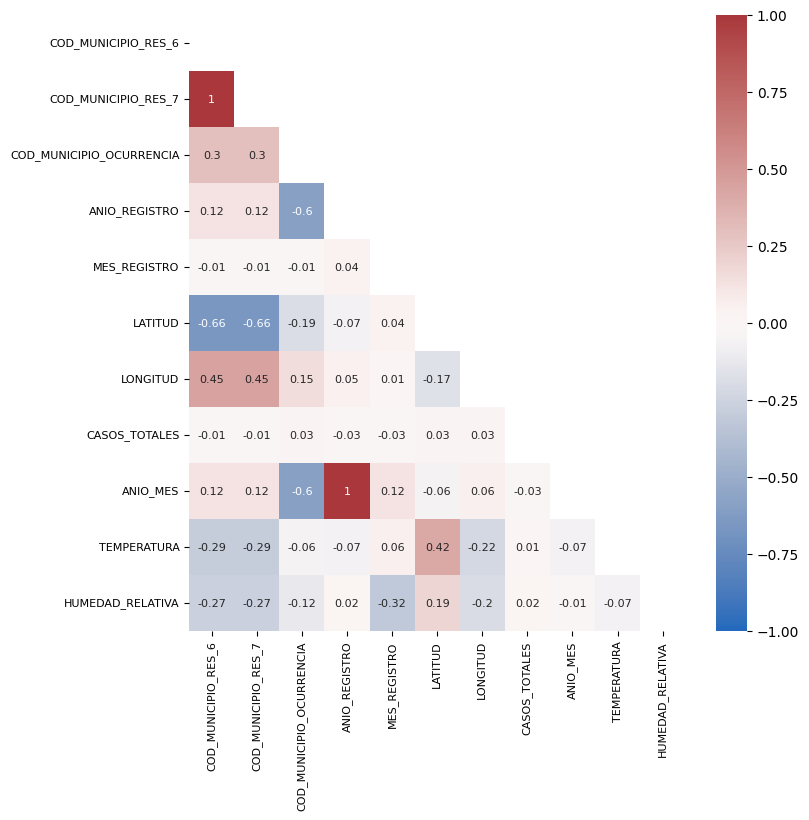

In [ ]:
numeric_df = df.select_dtypes(include=[np.number])
correlation_matrix = numeric_df.corr()
plt.figure(figsize=(8, 8))
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
heatmap = sns.heatmap(np.round(correlation_matrix, 2), annot=True, cmap="vlag", mask=mask, vmin=-1, vmax=1, annot_kws={"size": 8})
heatmap.set_xticklabels(heatmap.get_xticklabels(), fontsize=8)
heatmap.set_yticklabels(heatmap.get_yticklabels(), fontsize=8)

plt.show()

## 2) Visualizacion Atributos Categoricas Ordinales y Nominales

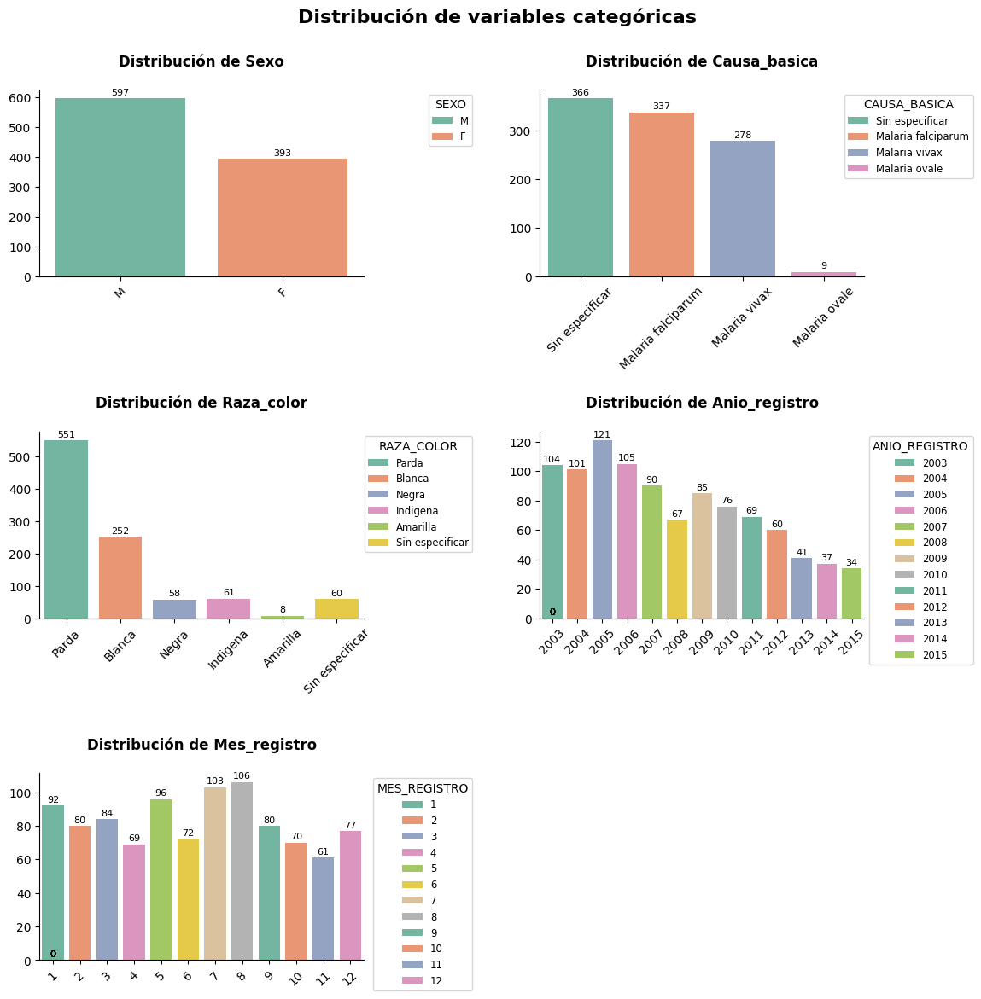

In [ ]:
def plot_dynamic_countplots(df, cols, ncols=2, palette='Set2', suptitle=''):
    nrows = math.ceil(len(cols) / ncols)
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*6, nrows*4))
    axes = axes.flatten()

    plt.suptitle(suptitle, fontsize=16, fontweight='bold')

    for idx, col in enumerate(cols):
        ax = axes[idx]
        sns.countplot(data=df, x=col, hue=col, ax=ax, palette=palette, dodge=False)

        categories = df[col].cat.categories if df[col].dtype.name == 'category' else sorted(df[col].unique())  # Modificación aquí
        labels = [f'{val}' for val in categories]

        for p in ax.patches:
            ax.annotate(format(p.get_height(), '.0f'),
                        (p.get_x() + p.get_width() / 2., p.get_height()),
                        ha='center', va='center',
                        xytext=(0, 5),
                        textcoords='offset points',
                        fontsize=8)

        ax.legend(title=col, labels=labels, loc='upper right', bbox_to_anchor=(1.35, 1), fontsize='small')
        ax.set_title(f'Distribución de {col.capitalize()}', fontweight='bold', pad=20)
        ax.tick_params(axis='x', rotation=45)
        ax.set_xlabel('')
        ax.set_ylabel('')

        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    for j in range(idx + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout(pad=2.0)
    plt.show()

cols_to_plot = ['SEXO', 'CAUSA_BASICA', 'RAZA_COLOR', 'ANIO_REGISTRO', 'MES_REGISTRO']
plot_dynamic_countplots(df, cols_to_plot, suptitle='Distribución de variables categóricas')


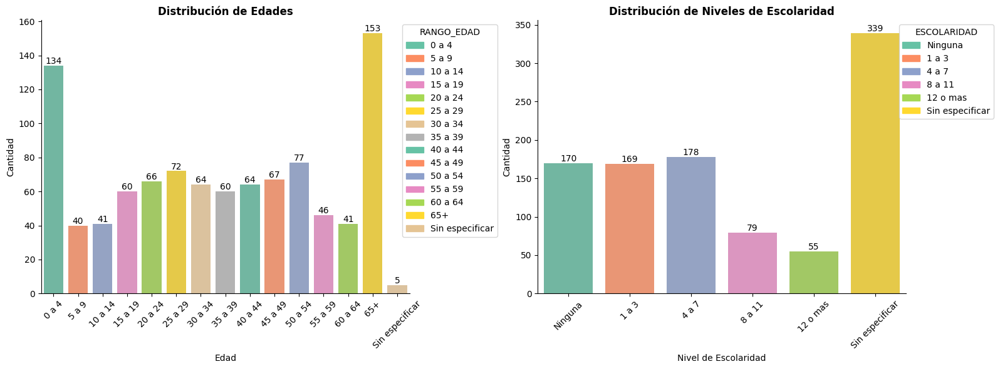

In [ ]:
palette_edades = sns.color_palette('Set2', len(df['RANGO_EDAD'].cat.categories))
palette_escolaridad = sns.color_palette('Set2', len(df['ESCOLARIDAD'].cat.categories))

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))

ax1 = sns.countplot(data=df, x='RANGO_EDAD', palette=palette_edades,
                    dodge=False, linewidth=0, ax=axes[0], order=df['RANGO_EDAD'].cat.categories)

for p in ax1.patches:
    ax1.annotate(format(p.get_height(), '.0f'),
                 (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='center',
                 xytext=(0, 5),
                 textcoords='offset points',
                 fontsize=10)

handles1 = [plt.Rectangle((0, 0), 1, 1, color=palette_edades[i]) for i in range(len(df['RANGO_EDAD'].cat.categories))]
ax1.legend(handles1, df['RANGO_EDAD'].cat.categories, title='RANGO_EDAD', loc='upper right', bbox_to_anchor=(1.25, 1))

ax1.set_title('Distribución de Edades', fontweight='bold')
ax1.set_xlabel('Edad')
ax1.set_ylabel('Cantidad')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.tick_params(axis='x', rotation=45)

ax2 = sns.countplot(data=df, x='ESCOLARIDAD', palette=palette_escolaridad,
                    dodge=False, linewidth=0, ax=axes[1], order=df['ESCOLARIDAD'].cat.categories)

for p in ax2.patches:
    ax2.annotate(format(p.get_height(), '.0f'),
                 (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='center',
                 xytext=(0, 5),
                 textcoords='offset points',
                 fontsize=10)

handles2 = [plt.Rectangle((0, 0), 1, 1, color=palette_escolaridad[i]) for i in range(len(df['ESCOLARIDAD'].cat.categories))]
ax2.legend(handles2, df['ESCOLARIDAD'].cat.categories, title='ESCOLARIDAD', loc='upper right', bbox_to_anchor=(1.25, 1))

ax2.set_title('Distribución de Niveles de Escolaridad', fontweight='bold')
ax2.set_xlabel('Nivel de Escolaridad')
ax2.set_ylabel('Cantidad')
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


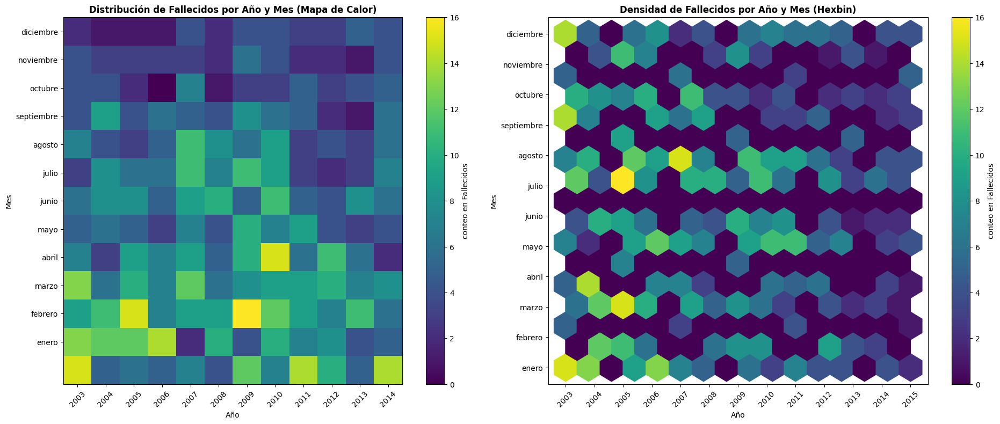

In [ ]:
unique_years = np.unique(df['ANIO_REGISTRO'])
unique_months = np.unique(df['MES_REGISTRO'])

month_names = {1: 'enero', 2: 'febrero', 3: 'marzo', 4: 'abril', 5: 'mayo', 6: 'junio',
               7: 'julio', 8: 'agosto', 9: 'septiembre', 10: 'octubre', 11: 'noviembre', 12: 'diciembre'}

unique_month_names = [month_names[m] for m in unique_months]

heatmap, xedges, yedges = np.histogram2d(df['ANIO_REGISTRO'], df['MES_REGISTRO'], bins=(unique_years.size, unique_months.size))

fig, axs = plt.subplots(1, 2, figsize=(20, 8))

axs[0].imshow(heatmap[::-1], cmap='viridis', interpolation='nearest')
axs[0].set_title('Distribución de Fallecidos por Año y Mes (Mapa de Calor)', fontweight='bold')
axs[0].set_xticks(np.arange(len(unique_years)))
axs[0].set_xticklabels(unique_years, rotation=45)
axs[0].set_yticks(np.arange(len(unique_months)))
axs[0].set_yticklabels(unique_month_names[::-1])
axs[0].set_xlabel('Año')
axs[0].set_ylabel('Mes')
axs[0].grid(False)
cbar = axs[0].figure.colorbar(axs[0].imshow(heatmap[::-1], cmap='viridis', interpolation='nearest'), ax=axs[0])
cbar.set_label('conteo en Fallecidos')

axs[1].hexbin(df['ANIO_REGISTRO'], df['MES_REGISTRO'], gridsize=15, cmap='viridis')
axs[1].set_title('Densidad de Fallecidos por Año y Mes (Hexbin)', fontweight='bold')
axs[1].set_xlabel('Año')
axs[1].set_ylabel('Mes')
axs[1].set_xticks(unique_years)
axs[1].set_xticklabels(unique_years, rotation=45)
axs[1].set_yticks(unique_months)
axs[1].set_yticklabels(unique_month_names)
cbar = axs[1].figure.colorbar(axs[1].collections[0], ax=axs[1])
cbar.set_label('conteo en Fallecidos')

plt.tight_layout()
plt.show()


## 3) Analisis de Geolocalización [Latitud, Longitud]

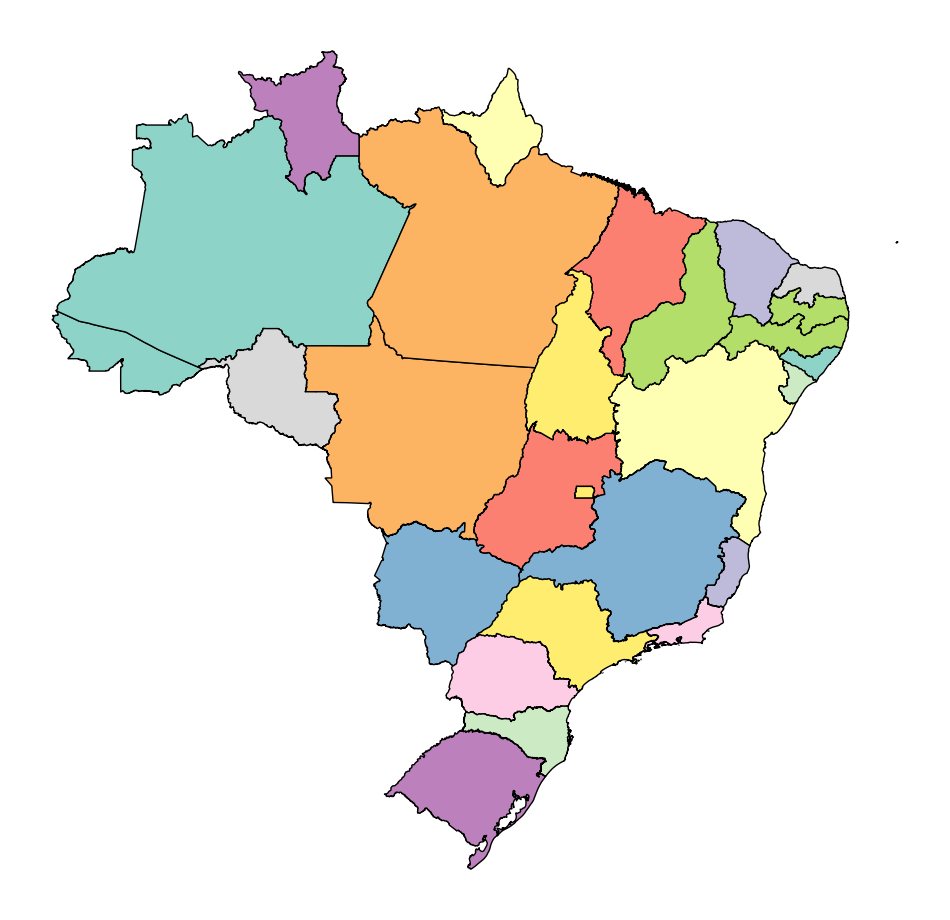

In [ ]:
url = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson"
departamentos = gpd.read_file(url)
fig, ax = plt.subplots(figsize=(12, 12))
departamentos.plot(ax=ax, edgecolor='black', cmap='Set3')
plt.axis('off')
plt.savefig('mapa.png')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 990 entries, 0 to 989
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   COD_MUNICIPIO_RES_6          990 non-null    int64   
 1   COD_MUNICIPIO_RES_7          990 non-null    int64   
 2   ESTADO_RESIDENCIA            990 non-null    object  
 3   NOMBRE_MUNICIPIO_RESIDENCIA  990 non-null    object  
 4   COD_MUNICIPIO_OCURRENCIA     990 non-null    int64   
 5   ANIO_REGISTRO                990 non-null    int64   
 6   MES_REGISTRO                 990 non-null    int64   
 7   SEXO                         990 non-null    category
 8   RAZA_COLOR                   990 non-null    category
 9   ESCOLARIDAD                  990 non-null    category
 10  RANGO_EDAD                   990 non-null    category
 11  LATITUD                      990 non-null    float64 
 12  LONGITUD                     990 non-null    float64 
 13  CASOS

In [ ]:
df['SEXO'].unique()

['M', 'F']
Categories (2, object): ['M' < 'F']

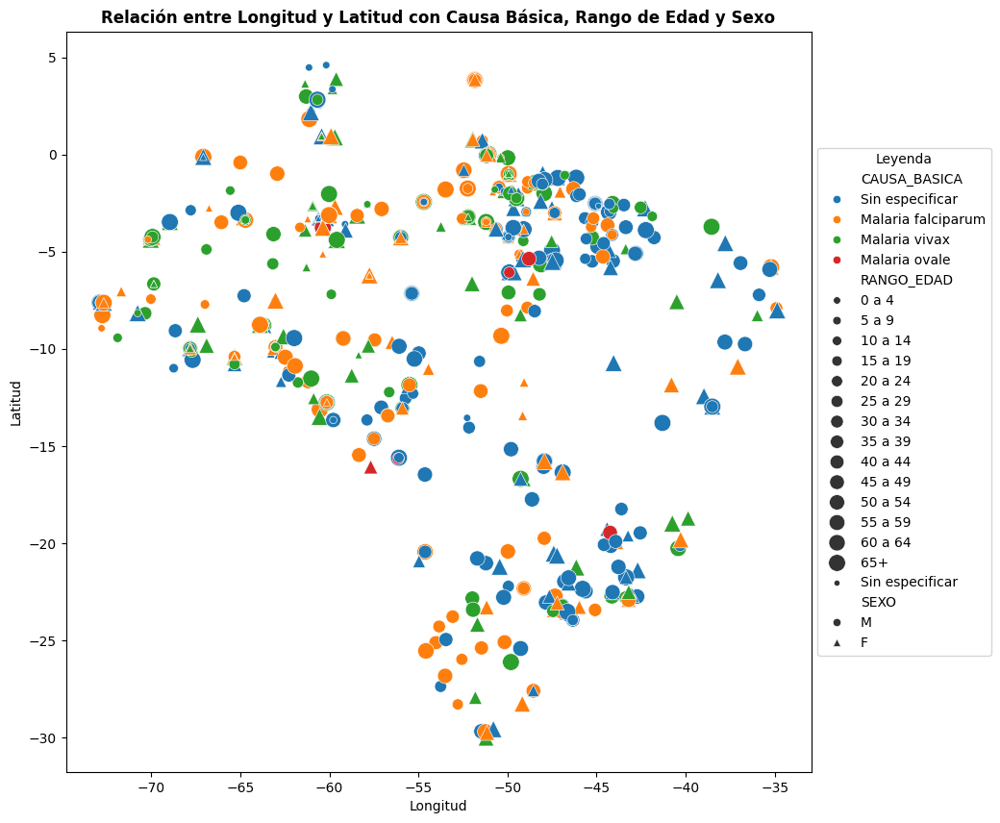

In [ ]:
plt.figure(figsize=(10, 10))

sizes = {'Sin especificar': 20, '0 a 4': 30, '5 a 9': 40, '10 a 14': 50, '15 a 19': 60, '20 a 24': 70,
         '25 a 29': 80, '30 a 34': 90, '35 a 39': 100, '40 a 44': 110, '45 a 49': 120, '50 a 54': 130,
         '55 a 59': 140, '60 a 64': 150, '65+': 160}

markers = {'M': 'o', 'F': '^'}

sns.scatterplot(data=df, x='LONGITUD', y='LATITUD', hue='CAUSA_BASICA', size='RANGO_EDAD', sizes=sizes, style='SEXO', markers=markers)

plt.title('Relación entre Longitud y Latitud con Causa Básica, Rango de Edad y Sexo', fontweight='bold')
plt.xlabel('Longitud')
plt.ylabel('Latitud')

plt.legend(title='Leyenda', loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

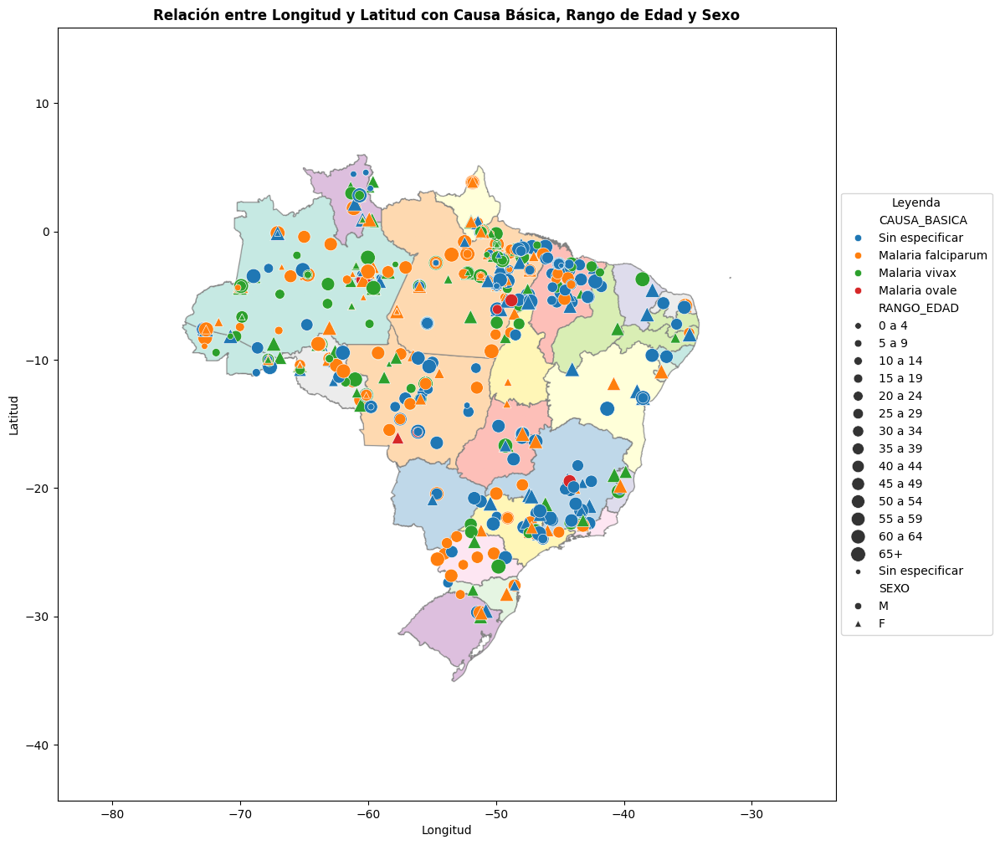

In [ ]:
background_img = mpimg.imread('/content/mapa.png')

plt.figure(figsize=(12, 12))

xmin_orig, xmax_orig = df['LONGITUD'].min(), df['LONGITUD'].max()
ymin_orig, ymax_orig = df['LATITUD'].min(), df['LATITUD'].max()

x_range = xmax_orig - xmin_orig
y_range = ymax_orig - ymin_orig
xmin = xmin_orig - 0.30 * x_range
xmax = xmax_orig + 0.30 * x_range
ymin = ymin_orig - 0.37 * y_range - 1.5
ymax = ymax_orig + 0.37 * y_range - 1.5

plt.imshow(background_img, extent=[xmin, xmax, ymin, ymax], aspect='auto', alpha=0.5)

sizes = {'Sin especificar': 20, '0 a 4': 30, '5 a 9': 40, '10 a 14': 50, '15 a 19': 60, '20 a 24': 70,
         '25 a 29': 80, '30 a 34': 90, '35 a 39': 100, '40 a 44': 110, '45 a 49': 120, '50 a 54': 130,
         '55 a 59': 140, '60 a 64': 150, '65+': 160}

markers = {'M': 'o', 'F': '^'}


sns.scatterplot(data=df, x='LONGITUD', y='LATITUD', hue='CAUSA_BASICA', size='RANGO_EDAD', sizes=sizes, style='SEXO', markers=markers)

plt.title('Relación entre Longitud y Latitud con Causa Básica, Rango de Edad y Sexo', fontweight='bold')
plt.xlabel('Longitud')
plt.ylabel('Latitud')

plt.legend(title='Leyenda', loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()


### 1 Vista de Mapa interactivo con la distribución de la mortalidad por malaria

In [ ]:

mapa_calor = folium.Map(location=[df['LATITUD'].mean(), df['LONGITUD'].mean()], zoom_start=5)


puntos = list(zip(df['LATITUD'], df['LONGITUD']))


HeatMap(puntos).add_to(mapa_calor)


def get_tooltip_data(index):
    row = df.iloc[index]
    tooltip = f'''
        <h4>Información adicional:</h4>
        <p><strong>Estado:</strong> {row['ESTADO_RESIDENCIA']}</p>
        <p><strong>Municipio:</strong> {row['NOMBRE_MUNICIPIO_RESIDENCIA']}</p>
        <p><strong>Causa básica:</strong> {row['CAUSA_BASICA']}</p>
        <p><strong>Rango de edad:</strong> {row['RANGO_EDAD']}</p>
    '''
    return tooltip


for i in range(len(df)):
    tooltip = get_tooltip_data(i)
    folium.Marker([df.loc[i, 'LATITUD'], df.loc[i, 'LONGITUD']], tooltip=tooltip).add_to(mapa_calor)

total_casos = len(df)
casos_por_estado = df['ESTADO_RESIDENCIA'].value_counts()

estadisticas_html = f'''
    <div style="position: fixed; top: 10px; right: 10px; z-index:1000; background-color:white; padding: 10px; border: 2px solid black; border-radius: 5px;">
        <h4>Estadísticas resumidas:</h4>
        <p><strong>Total de casos:</strong> {total_casos}</p>
        <h5>Casos por estado:</h5>
        <ul>
    '''
for estado, casos in casos_por_estado.items():
    estadisticas_html += f'<li>{estado}: {casos}</li>'
estadisticas_html += '</ul></div>'

mapa_calor.get_root().html.add_child(folium.Element(estadisticas_html))

folium.LayerControl().add_to(mapa_calor)
folium.plugins.MousePosition().add_to(mapa_calor)

mapa_calor


## 4) Forecasting (Anio_registro, Mes_registro)

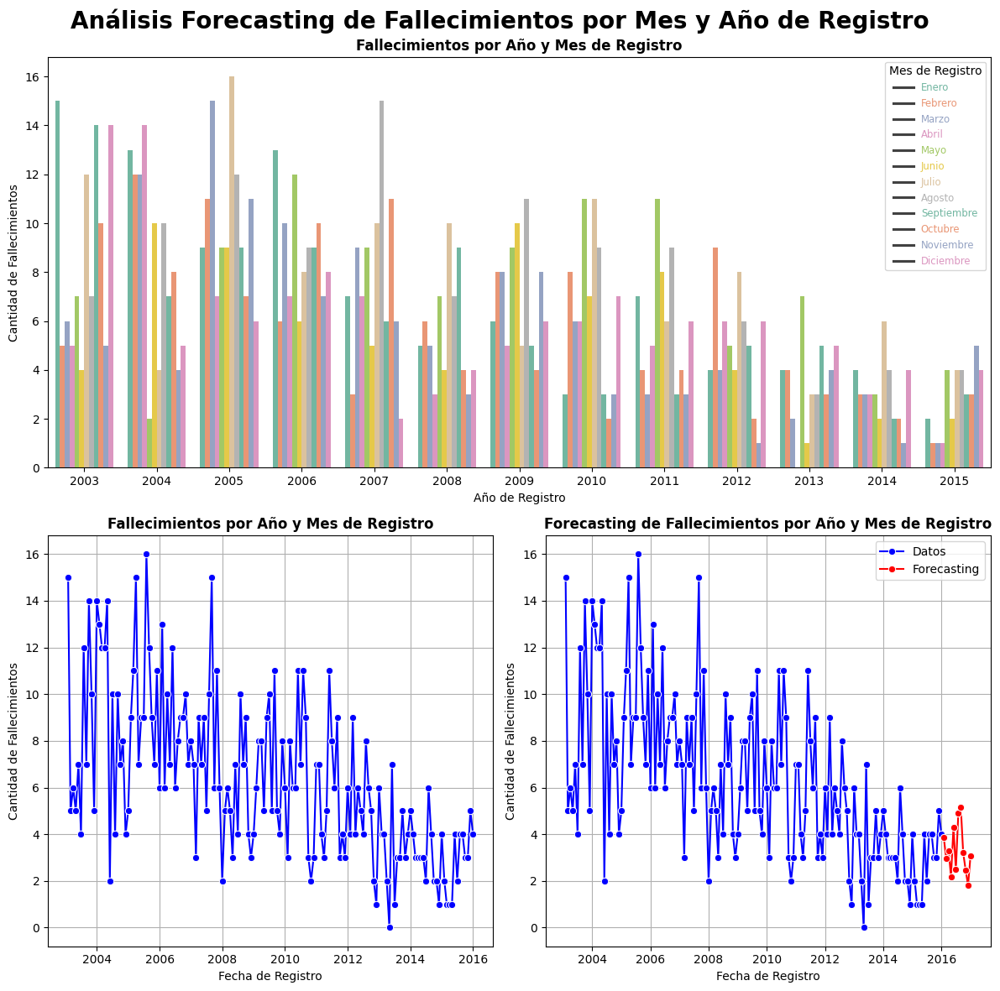

In [ ]:
plt.figure(figsize=(12, 12))

plt.subplot(2, 2, (1, 2))
df_grouped = df.groupby(['ANIO_REGISTRO', 'MES_REGISTRO']).size().reset_index(name='Cantidad')
meses_en_espanol = {1: 'Enero', 2: 'Febrero', 3: 'Marzo', 4: 'Abril', 5: 'Mayo', 6: 'Junio',
                    7: 'Julio', 8: 'Agosto', 9: 'Septiembre', 10: 'Octubre', 11: 'Noviembre', 12: 'Diciembre'}
df_grouped['MES_REGISTRO'] = df_grouped['MES_REGISTRO'].map(meses_en_espanol)
barplot = sns.barplot(data=df_grouped, x='ANIO_REGISTRO', y='Cantidad', hue='MES_REGISTRO', palette='Set2')
plt.title('Fallecimientos por Año y Mes de Registro', fontweight='bold')
plt.xlabel('Año de Registro')
plt.ylabel('Cantidad de Fallecimientos')

handles, _ = barplot.get_legend_handles_labels()
colors = [h.get_facecolor()[:3] for h in handles]

meses_legend = [meses_en_espanol[i] for i in range(1, 13)]
legend = plt.legend(title='Mes de Registro', labels=meses_legend, loc='upper right', fontsize='small')
for text, color in zip(legend.get_texts(), colors):
    text.set_color(color)

plt.subplot(2, 2, 3)
df['FECHA_REGISTRO'] = pd.to_datetime(df['ANIO_REGISTRO'].astype(str) + '-' + df['MES_REGISTRO'].astype(str), format='%Y-%m')
df.set_index('FECHA_REGISTRO', inplace=True)
df_grouped = df.groupby(pd.Grouper(freq='M')).size().reset_index(name='Cantidad')
sns.lineplot(data=df_grouped, x='FECHA_REGISTRO', y='Cantidad', marker='o', color='b')
plt.title('Fallecimientos por Año y Mes de Registro', fontweight='bold')
plt.xlabel('Fecha de Registro')
plt.ylabel('Cantidad de Fallecimientos')
plt.grid(True)

plt.subplot(2, 2, 4)
model = ExponentialSmoothing(df_grouped['Cantidad'], seasonal='add', seasonal_periods=12)
fit_model = model.fit()
forecast = fit_model.forecast(12)
sns.lineplot(data=df_grouped, x='FECHA_REGISTRO', y='Cantidad', marker='o', color='b', label='Datos')
sns.lineplot(x=pd.date_range(start=df_grouped['FECHA_REGISTRO'].iloc[-1], periods=13, freq='M')[1:], y=forecast, marker='o', color='r', label='Forecasting')
plt.title('Forecasting de Fallecimientos por Año y Mes de Registro', fontweight='bold')
plt.xlabel('Fecha de Registro')
plt.ylabel('Cantidad de Fallecimientos')
plt.grid(True)
plt.legend()

plt.suptitle('Análisis Forecasting de Fallecimientos por Mes y Año de Registro', fontweight='bold', fontsize=20)

plt.tight_layout()
plt.show()


###  2 Vista de Barras apiladas interactivas con la distribución de casos de mortalidad por año y mes de registro

> Añadir blockquote



In [ ]:
df_grouped = df.groupby(['ANIO_REGISTRO', 'MES_REGISTRO']).size().reset_index(name='Cantidad')
meses_en_espanol = {1: 'Enero', 2: 'Febrero', 3: 'Marzo', 4: 'Abril', 5: 'Mayo', 6: 'Junio',
                    7: 'Julio', 8: 'Agosto', 9: 'Septiembre', 10: 'Octubre', 11: 'Noviembre', 12: 'Diciembre'}
df_grouped['MES_REGISTRO'] = df_grouped['MES_REGISTRO'].map(meses_en_espanol)

fig = px.bar(df_grouped,
             x='ANIO_REGISTRO',
             y='Cantidad',
             color='MES_REGISTRO',
             title='Fallecimientos por Año y Mes de Registro',
             labels={
                 'ANIO_REGISTRO': 'Año de Registro',
                 'Cantidad': 'Cantidad de Fallecimientos',
                 'MES_REGISTRO': 'Mes de Registro'
             },
             color_discrete_sequence=px.colors.qualitative.Set2)

fig.update_layout(
    xaxis=dict(
        tickmode='linear'
    ),
    title={
        'text': 'Fallecimientos por Año y Mes de Registro',
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    xaxis_title='Año de Registro',
    yaxis_title='Cantidad de Fallecimientos',
    legend_title='Mes de Registro'
)

fig.show()

### 7 Vista de Pronóstico interactivo de muertes para el año 2016

In [ ]:
df['FECHA_REGISTRO'] = pd.to_datetime(df['ANIO_REGISTRO'].astype(str) + '-' + df['MES_REGISTRO'].astype(str), format='%Y-%m')
df_grouped = df.groupby(pd.Grouper(key='FECHA_REGISTRO', freq='M')).size().reset_index(name='Cantidad')
model = ExponentialSmoothing(df_grouped['Cantidad'], seasonal='add', seasonal_periods=12)
fit_model = model.fit()
forecast_dates = pd.date_range(start=df_grouped['FECHA_REGISTRO'].iloc[-1], periods=13, freq='M')[1:]
forecast = fit_model.forecast(12)
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_grouped['FECHA_REGISTRO'], y=df_grouped['Cantidad'], mode='lines+markers', name='Datos'))
fig.add_trace(go.Scatter(x=forecast_dates, y=forecast, mode='lines+markers', name='Forecast', line=dict(color='red')))
fig.update_layout(title='Forecasting de Fallecimientos por Año y Mes de Registro',
                  xaxis_title='Fecha de Registro',
                  yaxis_title='Cantidad de Fallecimientos',
                  hovermode='x unified')

fig.show()

## 5) Sunburst (Grafico Interactivo)

### 9 Vista radial Interactiva de casos de mortalidad por municipio y estado de residencia

In [ ]:
municipios_por_estado = df.groupby(['ESTADO_RESIDENCIA', 'NOMBRE_MUNICIPIO_RESIDENCIA']).size().reset_index(name='Count')

fig_sunburst = px.sunburst(municipios_por_estado, path=['ESTADO_RESIDENCIA', 'NOMBRE_MUNICIPIO_RESIDENCIA'], values='Count',
                           custom_data=['Count'],
                           width=800, height=600)
fig_sunburst.update_traces(hovertemplate='<b>%{label}</b><br>N° Fallecidos = %{customdata[0]}<extra></extra>')

municipios_por_estado_bar = df.groupby('ESTADO_RESIDENCIA')['NOMBRE_MUNICIPIO_RESIDENCIA'].nunique().reset_index(name='Count')
municipios_por_estado_bar = municipios_por_estado_bar.sort_values(by='Count', ascending=False)

fig_bar = px.bar(municipios_por_estado_bar, x='ESTADO_RESIDENCIA', y='Count',
                 labels={'Count': 'Número de Municipios Únicos', 'ESTADO_RESIDENCIA': 'Estado de Residencia'},
                 color='Count', color_continuous_scale='Viridis')

fig_bar.update_traces(hovertemplate='<b>Estado:</b> %{x}<br>' +
                                  '<b>Número de Municipios:</b> %{y}<br>')

fig = make_subplots(rows=1, cols=2,
                    subplot_titles=("Cantidad Fallecidos por Municipios por Estado",
                                    "Número de Municipios Únicos por Estado de Residencia"),
                    specs=[[{"type": "sunburst"}, {"type": "xy"}]])

for trace in fig_sunburst.data:
    fig.add_trace(trace, row=1, col=1)

for trace in fig_bar.data:
    fig.add_trace(trace, row=1, col=2)

fig.update_layout(title_text="<b>Comparación de Fallecimientos y Municipios por Estado</b>", title_x=0.5, showlegend=False)

fig.show()


### 10 Vista radial Interactiva de casos de mortalidad por año de registro y causa básica y 11 Vista radial Interactiva de casos de mortalidad por raza/color, sexo y causa básica

In [ ]:
data_sunburst = df.groupby(['ANIO_REGISTRO', 'CAUSA_BASICA']).size().reset_index(name='Count')
data_sunburst.columns = ['Año_registro', 'Causa_basica', 'Count']
data_sunburst = data_sunburst.sort_values(by=['Año_registro', 'Causa_basica'])
data_sunburst_filtered = data_sunburst[data_sunburst['Count'] > 0]

sexo_labels = {'M': 'Masculino', 'F': 'Femenino', 'I': 'Indeterminado'}
data_sunburst_3levels = df.replace({'SEXO': sexo_labels}).groupby(['RAZA_COLOR', 'SEXO', 'CAUSA_BASICA']).size().reset_index(name='Count')
data_sunburst_3levels_filtered = data_sunburst_3levels[data_sunburst_3levels['Count'] > 0]

fig_sunburst1 = px.sunburst(data_sunburst_filtered, path=['Año_registro', 'Causa_basica'], values='Count',
                            color='Count', color_continuous_scale='Viridis')
fig_sunburst1.update_traces(hovertemplate='<b>%{label}</b><br>N° Fallecidos = %{value}<extra></extra>', maxdepth=2)

fig_sunburst2 = px.sunburst(data_sunburst_3levels_filtered, path=['RAZA_COLOR', 'SEXO', 'CAUSA_BASICA'], values='Count',
                            color='Count', color_continuous_scale='Viridis')
fig_sunburst2.update_traces(hovertemplate='<b>%{label}</b><br>N° Fallecidos = %{value}<extra></extra>')

fig = make_subplots(rows=1, cols=2,
                    subplot_titles=("Distribución de Fallecimientos por Año y Causa Básica",
                                    "Distribución de Fallecimientos por Raza/Color, Sexo y Causa Básica"),
                    specs=[[{"type": "sunburst"}, {"type": "sunburst"}]])

for trace in fig_sunburst1.data:
    fig.add_trace(trace, row=1, col=1)

for trace in fig_sunburst2.data:
    fig.add_trace(trace, row=1, col=2)

fig.update_layout(coloraxis=dict(colorscale='Viridis', colorbar=dict(title="N° Fallecidos", orientation="v")))

fig.update_layout(title_text="<b>Comparación de Distribuciones de Fallecimientos</b>",
                  title_x=0.5,
                  showlegend=False,
                  template=None)

fig.update_layout(title={
    'text': '<b>Comparación de Distribuciones de Fallecimientos</b>',
    'y':0.9,
    'x':0.5,
    'xanchor': 'center',
    'yanchor': 'top'},
    annotations=[
        dict(
            text='Fuente: Datos de Fallecimientos',
            x=0.5,
            y=-0.1,
            showarrow=False,
            xref='paper',
            yref='paper',
            font=dict(size=12)
        )
    ]
)

fig.show()


## 6) Grafico de Violin

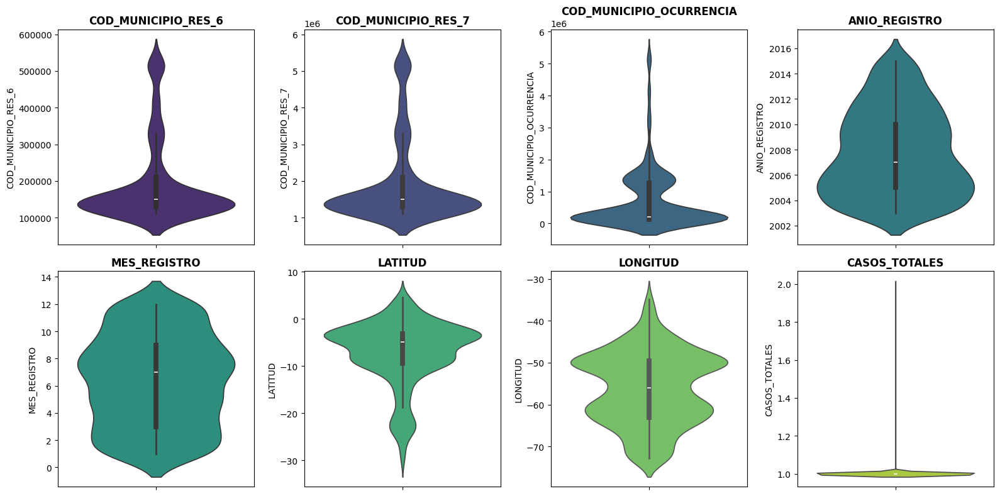

In [ ]:
num_cols = ['COD_MUNICIPIO_RES_6', 'COD_MUNICIPIO_RES_7', 'COD_MUNICIPIO_OCURRENCIA',
            'ANIO_REGISTRO', 'MES_REGISTRO', 'LATITUD', 'LONGITUD', 'CASOS_TOTALES']

plt.figure(figsize=(16, 8))

palette = sns.color_palette("viridis", len(num_cols))

for i, col in enumerate(num_cols, 1):
    plt.subplot(2, 4, i)
    sns.violinplot(y=df[col], color=palette[i-1])
    plt.title(col, fontweight='bold', fontsize=12)

plt.tight_layout()
plt.show()


In [ ]:

fig = px.box(df, y=['MES_REGISTRO','LATITUD','LONGITUD','CASOS_TOTALES'],
             title="<b>Boxplot Interactivo</b>",
             points="outliers", height=1000,
             color_discrete_sequence=['#FF5733'],
             labels={'value': 'Valor', 'variable': 'Variable'}
            )

fig.update_traces(boxmean='sd', jitter=0.5)
fig.show()


### 12 Vista de caja interactiva por año de registro

In [ ]:
fig = px.box(df, y='ANIO_REGISTRO',
             title="<b>Boxplot Interactivo del Año de Registro</b>",
             points="outliers", height=800, width=1000,
             color_discrete_sequence=['#FF5733'],
             labels={'ANIO_REGISTRO': 'Año de Registro'}
            )
fig.update_traces(boxmean='sd', jitter=0.5)
fig.show()

### 8 Vista Nube de palabras de casos de mortalidad por estado y municipio de residencia

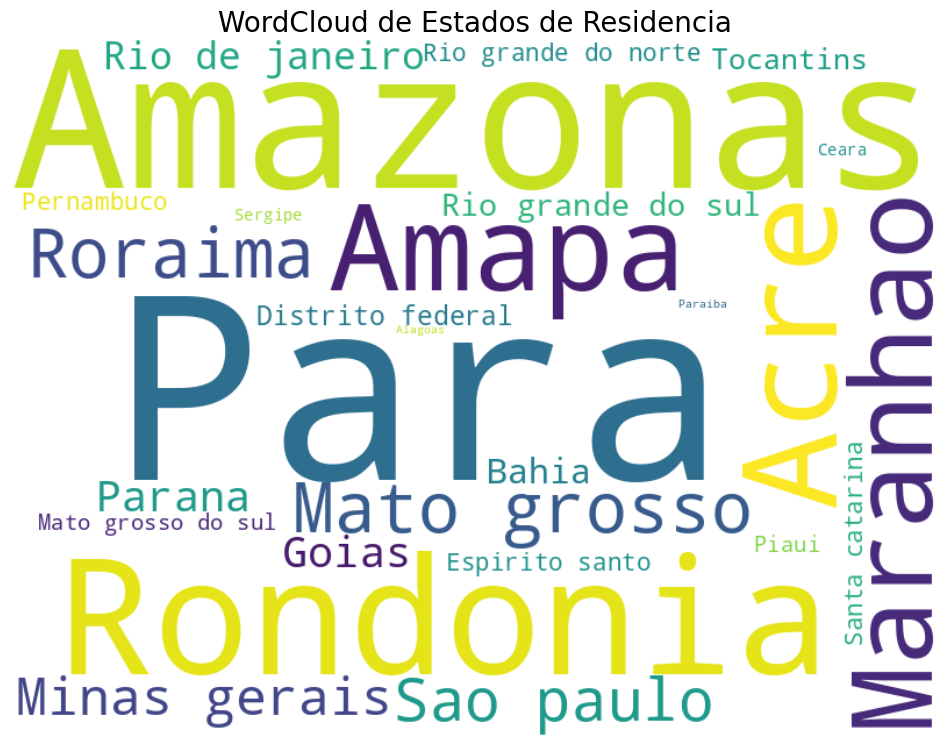

In [ ]:
estado_frequencies = df['ESTADO_RESIDENCIA'].value_counts().to_dict()

wordcloud = WordCloud(width=800, height=600, background_color='white').generate_from_frequencies(estado_frequencies)

plt.figure(figsize=(12, 14))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('WordCloud de Estados de Residencia', fontsize=20)
plt.axis('off')
plt.show()


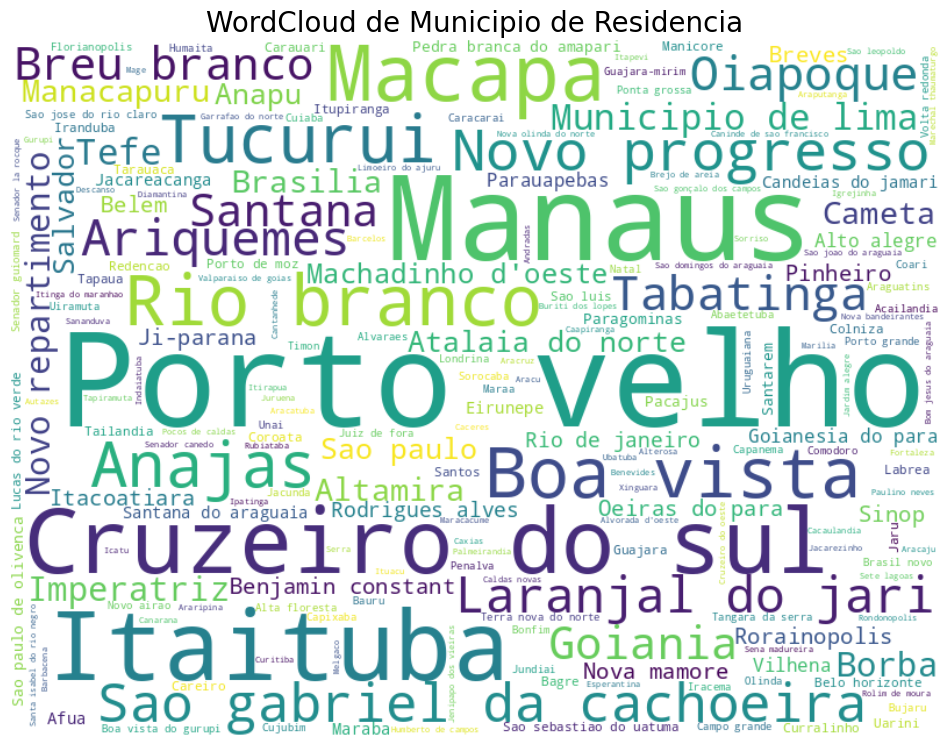

In [ ]:
estado_frequencies = df['NOMBRE_MUNICIPIO_RESIDENCIA'].value_counts().to_dict()

wordcloud = WordCloud(width=800, height=600, background_color='white').generate_from_frequencies(estado_frequencies)

plt.figure(figsize=(12, 14))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('WordCloud de Municipio de Residencia', fontsize=20)
plt.axis('off')
plt.show()


### 6 Vista de flujo interactivo de mortalidad por sexo, causa basica y estado

In [ ]:
grouped_df = df.groupby(['SEXO', 'CAUSA_BASICA', 'ESTADO_RESIDENCIA'])['CASOS_TOTALES'].sum().reset_index()

nodos = list(set(grouped_df['SEXO']).union(set(grouped_df['CAUSA_BASICA'])).union(set(grouped_df['ESTADO_RESIDENCIA'])))
nodos_indices = {nodo: i for i, nodo in enumerate(nodos)}

origen_1 = grouped_df['SEXO'].tolist()
destino_1 = grouped_df['CAUSA_BASICA'].tolist()
valores_1 = grouped_df['CASOS_TOTALES'].tolist()

origen_indices_1 = [nodos_indices[nodo] for nodo in origen_1]
destino_indices_1 = [nodos_indices[nodo] for nodo in destino_1]

origen_2 = grouped_df['CAUSA_BASICA'].tolist()
destino_2 = grouped_df['ESTADO_RESIDENCIA'].tolist()
valores_2 = grouped_df['CASOS_TOTALES'].tolist()

origen_indices_2 = [nodos_indices[nodo] for nodo in origen_2]
destino_indices_2 = [nodos_indices[nodo] for nodo in destino_2]

origen_indices = origen_indices_1 + origen_indices_2
destino_indices = destino_indices_1 + destino_indices_2
valores = valores_1 + valores_2

fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=5,
        thickness=30,
        line=dict(color="black", width=0.5),
        label=nodos
    ),
    link=dict(
        source=origen_indices,
        target=destino_indices,
        value=valores
    ))])

fig.update_layout(title_text="Diagrama de Sankey de Muertes por Malaria en Brasil", font_size=10)
fig.show()


9) Muertes relacionadas por edad en los diferentes años

### 5 Vista de líneas interactivas de mortalidad por año de registro y rango de edad

In [ ]:
grouped_df = df.groupby(['ANIO_REGISTRO', 'RANGO_EDAD'])['CASOS_TOTALES'].sum().reset_index()

orden_rango_edad = df['RANGO_EDAD'].cat.categories.tolist()

fig = px.line(grouped_df,
              x='ANIO_REGISTRO',
              y='CASOS_TOTALES',
              color='RANGO_EDAD',
              title='Muertes Relacionadas por Edad en los Diferentes Años',
              category_orders={'RANGO_EDAD': orden_rango_edad})

fig.update_layout(xaxis_title='Año de Registro',
                  yaxis_title='Casos Totales',
                  legend_title='Rango de Edad')

fig.show()


### 4 Vista de barras apiladas interactivas de mortalidad por año de registro y rango de edad

In [ ]:
fig = px.bar(grouped_df,
             x='ANIO_REGISTRO',
             y='CASOS_TOTALES',
             color='RANGO_EDAD',
             title='Muertes Relacionadas por Edad en los Diferentes Años',
             barmode='stack')

fig.update_xaxes(categoryorder='total ascending')
fig.update_xaxes(tickvals=grouped_df['ANIO_REGISTRO'].unique())

fig.show()

In [ ]:
df = df.drop(columns=['FECHA_REGISTRO'])
df = df.reset_index(drop=True)

In [ ]:
df.to_csv('Muertes_Malaria_Brazil_ML.csv', index=False)

### 13 Vista de dispersión de mortalidad con temperatura por año y mes de registro

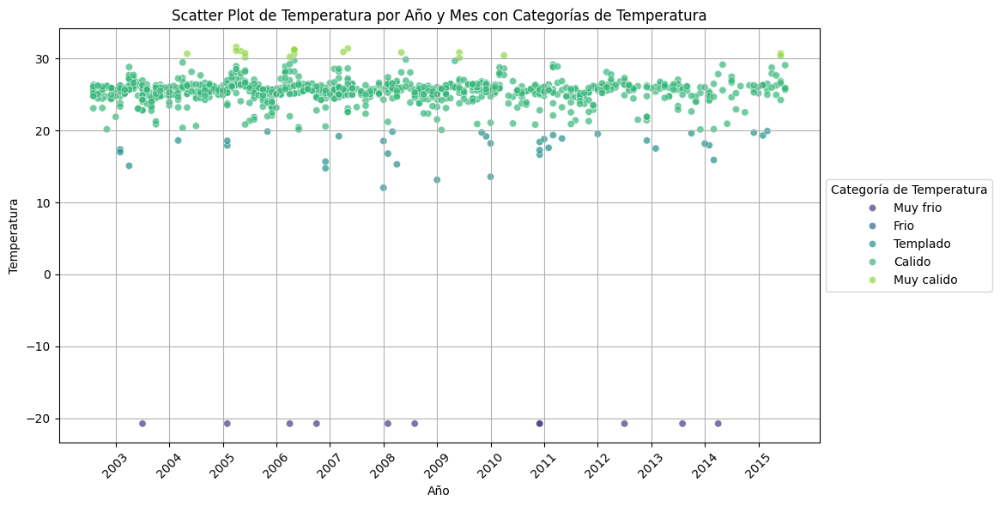

In [ ]:
plt.figure(figsize=(12, 6))
scatter = sns.scatterplot(
    x='ANIO_MES',
    y='TEMPERATURA',
    hue='CATEGORIA_TEMPERATURA',
    palette='viridis',
    data=df,
    alpha=0.7
)

plt.title('Scatter Plot de Temperatura por Año y Mes con Categorías de Temperatura', )
plt.xlabel('Año')
plt.ylabel('Temperatura')
plt.grid(True)

years = df['ANIO_REGISTRO'].unique()
plt.xticks(years + 0.5, years, rotation=45)

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Categoría de Temperatura')

plt.tight_layout()
plt.subplots_adjust(right=0.8)
plt.show()


## LabelEncoder - Categoricas a numericas

In [ ]:
category_columns = df.select_dtypes(include='category').columns
category_columns = category_columns.drop('CAUSA_BASICA')

# Convertir las variables categóricas a numéricas usando LabelEncoder
le = LabelEncoder()
for col in category_columns:
    df[col + '_encoded'] = le.fit_transform(df[col])


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 990 entries, 0 to 989
Data columns (total 26 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   COD_MUNICIPIO_RES_6            990 non-null    int64   
 1   COD_MUNICIPIO_RES_7            990 non-null    int64   
 2   ESTADO_RESIDENCIA              990 non-null    object  
 3   NOMBRE_MUNICIPIO_RESIDENCIA    990 non-null    object  
 4   COD_MUNICIPIO_OCURRENCIA       990 non-null    int64   
 5   ANIO_REGISTRO                  990 non-null    int64   
 6   MES_REGISTRO                   990 non-null    int64   
 7   SEXO                           990 non-null    category
 8   RAZA_COLOR                     990 non-null    category
 9   ESCOLARIDAD                    990 non-null    category
 10  RANGO_EDAD                     990 non-null    category
 11  LATITUD                        990 non-null    float64 
 12  LONGITUD                       990 n

## Mapa de Calor Correlaciones metodo Pearson

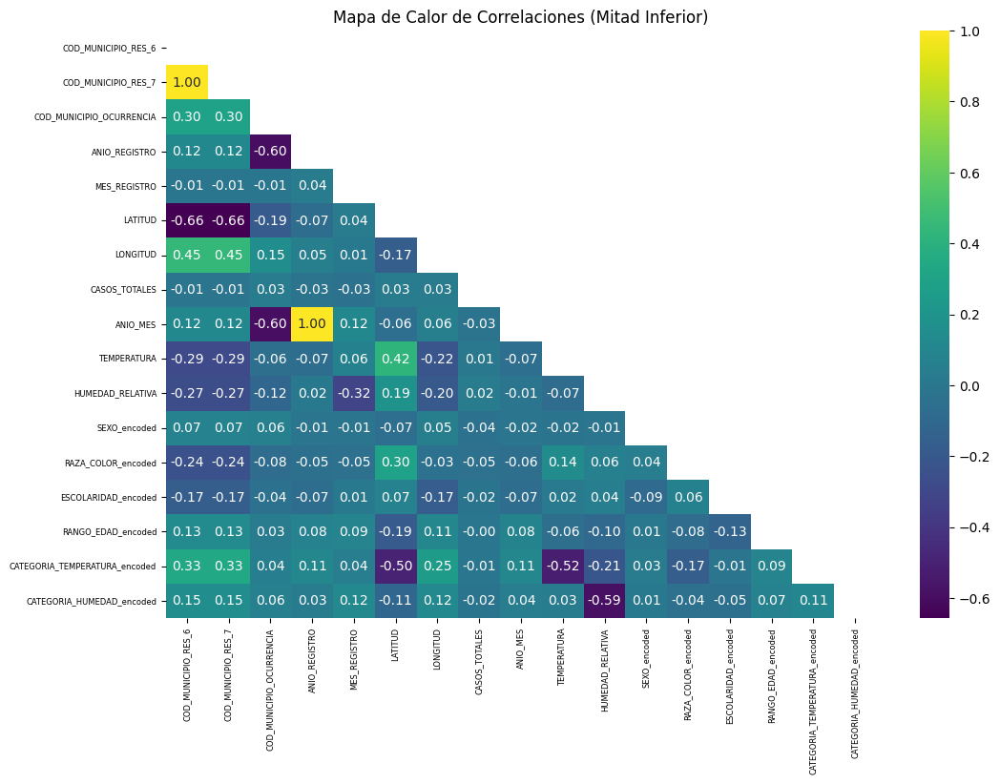

In [ ]:
numerical_columns = df.select_dtypes(include=['int', 'float']).columns

X = df[numerical_columns]

corrmat = X.corr(method="pearson")
top_corr_features = corrmat.index

# Crear una máscara para la mitad inferior
mask = np.triu(np.ones_like(corrmat, dtype=bool))

# Configurar tamaño de la figura
plt.figure(figsize=(12, 8))

# Plotear mapa de calor solo con la mitad inferior
sns.heatmap(corrmat, mask=mask, annot=True, cmap="viridis", fmt=".2f", annot_kws={"size": 10})  # Ajustar el tamaño de la fuente aquí

# Configuraciones adicionales
plt.title('Mapa de Calor de Correlaciones (Mitad Inferior)')
plt.xticks(fontsize=6)
plt.yticks(fontsize=6)
plt.show()


## Seleccion de caracteristicas (SeleckKBest con chi2, ExtratreesClassifier, ANOVA F-value, Mutual Information, Regresion Logistica, Lasso)

In [ ]:
y = df['CAUSA_BASICA']
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Seleccionar las columnas numéricas
numerical_columns = df.select_dtypes(include=['int', 'float']).columns
X = df[numerical_columns]

# Normalizar los datos usando MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Usar SelectKBest con chi2
bestfeatures_chi2 = SelectKBest(score_func=chi2, k=10)
fit_chi2 = bestfeatures_chi2.fit(X_scaled, y_encoded)
top_features_chi2 = X.columns[fit_chi2.get_support()]

# Usar ExtraTreesClassifier con random_state
model_et = ExtraTreesClassifier(random_state=42)
model_et.fit(X_scaled, y_encoded)
feat_importances_et = pd.Series(model_et.feature_importances_, index=X.columns)
top_features_et = feat_importances_et.nlargest(10).index

# Usar SelectKBest con f_classif (ANOVA F-value)
bestfeatures_anova = SelectKBest(score_func=f_classif, k=10)
fit_anova = bestfeatures_anova.fit(X_scaled, y_encoded)
top_features_anova = X.columns[fit_anova.get_support()]

# Usar SelectKBest con mutual_info_classif (Mutual Information)
bestfeatures_mi = SelectKBest(score_func=mutual_info_classif, k=10)
fit_mi = bestfeatures_mi.fit(X_scaled, y_encoded)
top_features_mi = X.columns[fit_mi.get_support()]

# Usar RFE con Logistic Regression y random_state
model_lr = LogisticRegression(max_iter=1000, random_state=42)
rfe = RFE(model_lr, n_features_to_select=10)
fit_rfe = rfe.fit(X_scaled, y_encoded)
top_features_rfe = X.columns[fit_rfe.get_support()]

# Usar Lasso con random_state
model_lasso = Lasso(alpha=0.01, random_state=42)
model_lasso.fit(X_scaled, y_encoded)
coef_lasso = pd.Series(model_lasso.coef_, index=X.columns)
top_features_lasso = coef_lasso.abs().nlargest(10).index

# Crear una lista de características seleccionadas
selected_features = [
    top_features_chi2,
    top_features_et,
    top_features_anova,
    top_features_mi,
    top_features_rfe,
    top_features_lasso
]

# Aplanar la lista de características seleccionadas y contar la frecuencia de cada característica
flat_list = [item for sublist in selected_features for item in sublist]
feature_counts = Counter(flat_list)

# Seleccionar las características más frecuentes
num_features_to_select = 5
top_features = [feature for feature, count in feature_counts.most_common(num_features_to_select)]
print("Características seleccionadas:", top_features)


Características seleccionadas: ['COD_MUNICIPIO_RES_6', 'LONGITUD', 'COD_MUNICIPIO_OCURRENCIA', 'RANGO_EDAD_encoded', 'COD_MUNICIPIO_RES_7']


In [ ]:
df.info()

In [ ]:
# top_features = ['COD_MUNICIPIO_RES_6', 'COD_MUNICIPIO_RES_7', 'COD_MUNICIPIO_OCURRENCIA', 'LONGITUD', 'RANGO_EDAD_encoded']

In [ ]:
# Filtrar solo las columnas seleccionadas
X_selected = df[top_features]

# Estandarizar los datos seleccionados
X_selected_scaled = scaler.fit_transform(X_selected)

# Aplicar PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(X_selected_scaled)

# Crear un DataFrame con los componentes principales
df_pca = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

# Obtener la varianza explicada
explained_variance = pca.explained_variance_ratio_
print("Varianza explicada por componente:", explained_variance)

# Obtener los coeficientes de cada componente
components = pca.components_

# Imprimir las variables más influyentes en cada componente
for i, component in enumerate(components):
    print(f"\nComponente {i+1}:")
    for index in np.argsort(np.abs(component))[::-1]:  # Ordenar de mayor a menor
        print(f"  {X_selected.columns[index]}: {component[index]:.2f}")

Varianza explicada por componente: [0.50520767 0.29320612]

Componente 1:
  COD_MUNICIPIO_RES_6: 0.63
  COD_MUNICIPIO_RES_7: 0.63
  LONGITUD: 0.33
  RANGO_EDAD_encoded: 0.26
  COD_MUNICIPIO_OCURRENCIA: 0.15

Componente 2:
  RANGO_EDAD_encoded: -0.96
  COD_MUNICIPIO_RES_6: 0.18
  COD_MUNICIPIO_RES_7: 0.18
  COD_MUNICIPIO_OCURRENCIA: 0.06
  LONGITUD: 0.05


## Reducir Dimensionalidad - PCA, LDA, t-SNE, UMAP

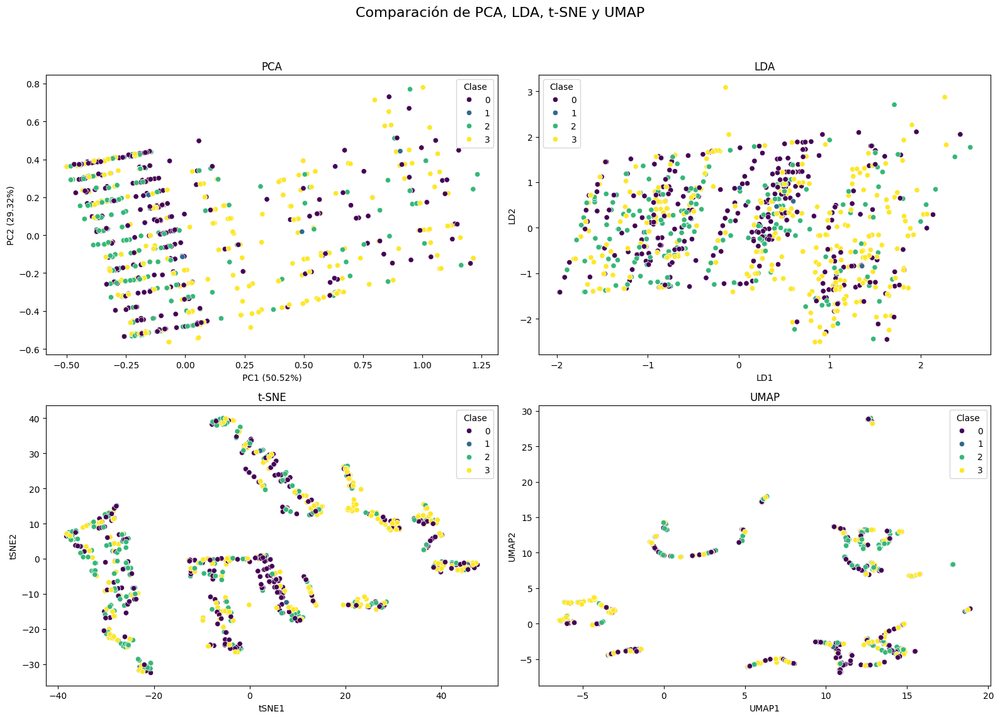

In [ ]:
# Aplicar PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(X_selected_scaled)
df_pca = pd.DataFrame(data=principal_components, columns=[f'PC{i+1} ({var:.2%})' for i, var in enumerate(pca.explained_variance_ratio_)])
df_pca['Clase'] = y_encoded

# Aplicar LDA
lda = LDA(n_components=2)
lda_components = lda.fit_transform(X_selected_scaled, y_encoded)
df_lda = pd.DataFrame(data=lda_components, columns=['LD1', 'LD2'])
df_lda['Clase'] = y_encoded

# Aplicar t-SNE
tsne = TSNE(n_components=2, random_state=0)
tsne_components = tsne.fit_transform(X_selected_scaled)
df_tsne = pd.DataFrame(data=tsne_components, columns=['tSNE1', 'tSNE2'])
df_tsne['Clase'] = y_encoded

# Aplicar UMAP
umap_model = umap.UMAP(n_components=2, random_state=0)
umap_components = umap_model.fit_transform(X_selected_scaled)
df_umap = pd.DataFrame(data=umap_components, columns=['UMAP1', 'UMAP2'])
df_umap['Clase'] = y_encoded

# Configuración de la gráfica
fig, axs = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Comparación de PCA, LDA, t-SNE y UMAP', fontsize=16)

# Graficar PCA
sns.scatterplot(data=df_pca, x=df_pca.columns[0], y=df_pca.columns[1], hue='Clase', palette='viridis', ax=axs[0, 0])
axs[0, 0].set_title('PCA')
axs[0, 0].set_xlabel(df_pca.columns[0])
axs[0, 0].set_ylabel(df_pca.columns[1])

# Graficar LDA
sns.scatterplot(data=df_lda, x='LD1', y='LD2', hue='Clase', palette='viridis', ax=axs[0, 1])
axs[0, 1].set_title('LDA')
axs[0, 1].set_xlabel('LD1')
axs[0, 1].set_ylabel('LD2')

# Graficar t-SNE
sns.scatterplot(data=df_tsne, x='tSNE1', y='tSNE2', hue='Clase', palette='viridis', ax=axs[1, 0])
axs[1, 0].set_title('t-SNE')
axs[1, 0].set_xlabel('tSNE1')
axs[1, 0].set_ylabel('tSNE2')

# Graficar UMAP
sns.scatterplot(data=df_umap, x='UMAP1', y='UMAP2', hue='Clase', palette='viridis', ax=axs[1, 1])
axs[1, 1].set_title('UMAP')
axs[1, 1].set_xlabel('UMAP1')
axs[1, 1].set_ylabel('UMAP2')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


## UMAP + Kmeans

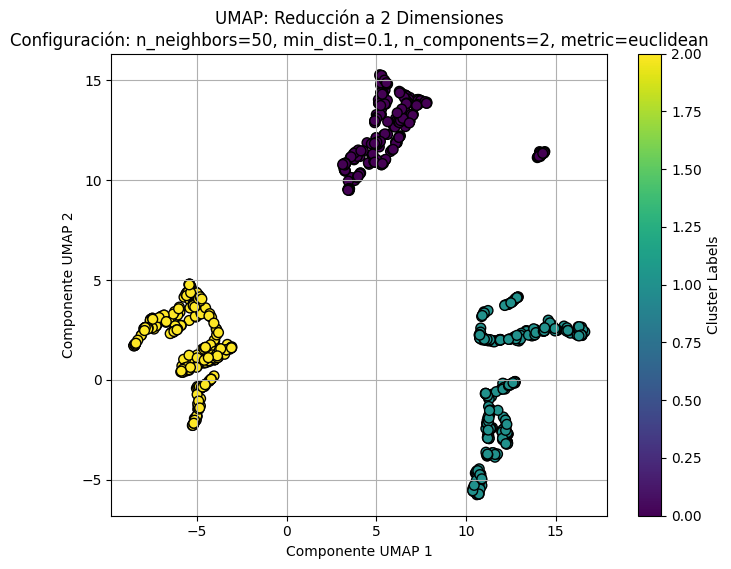

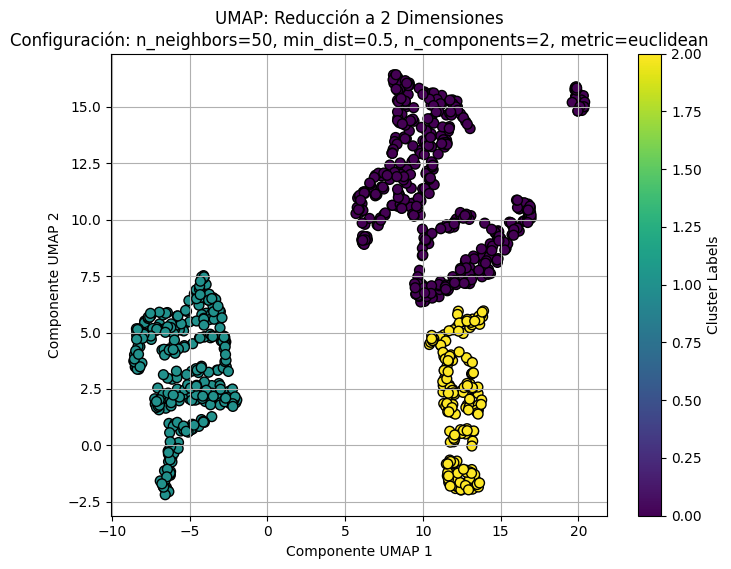

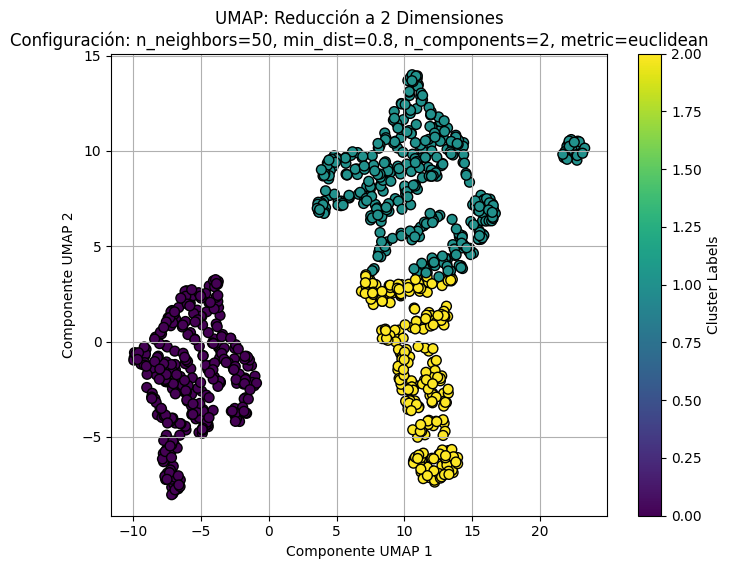

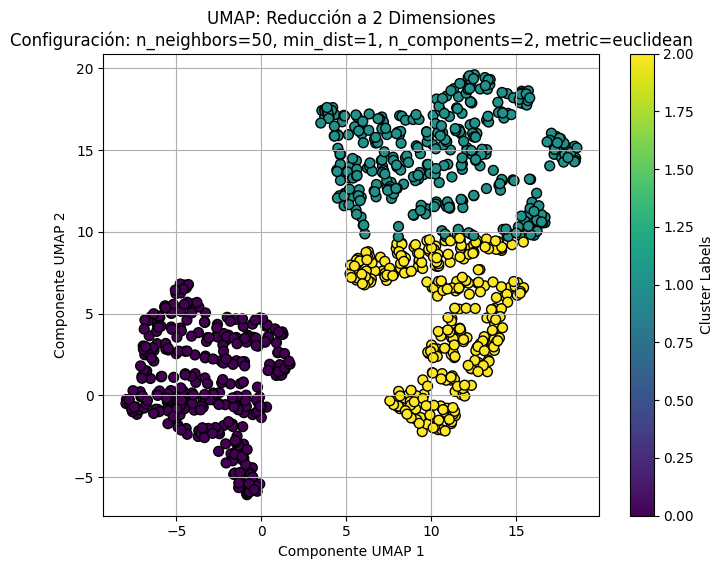

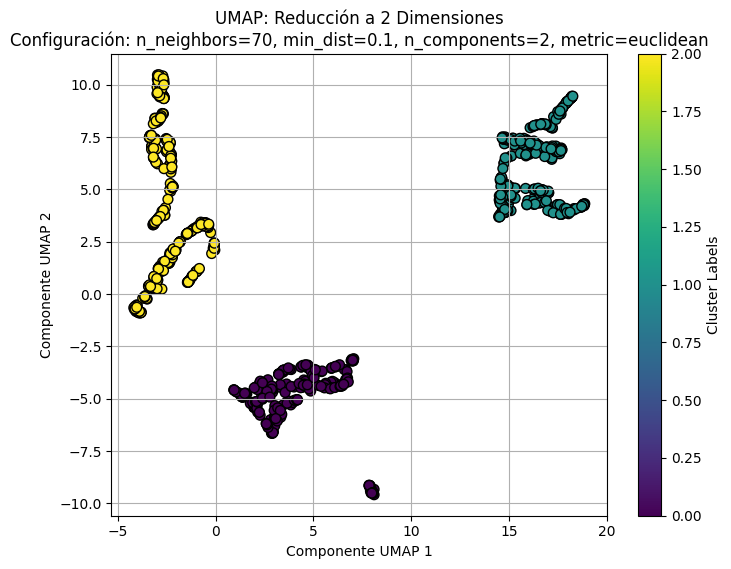

...

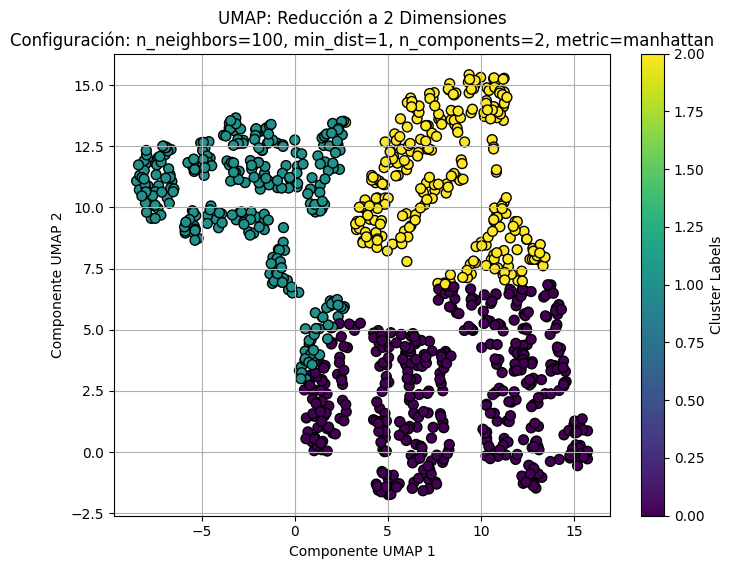

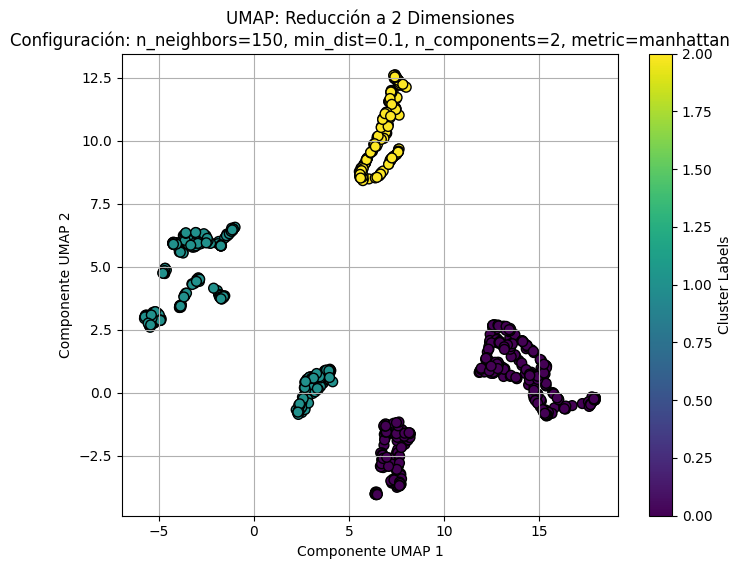

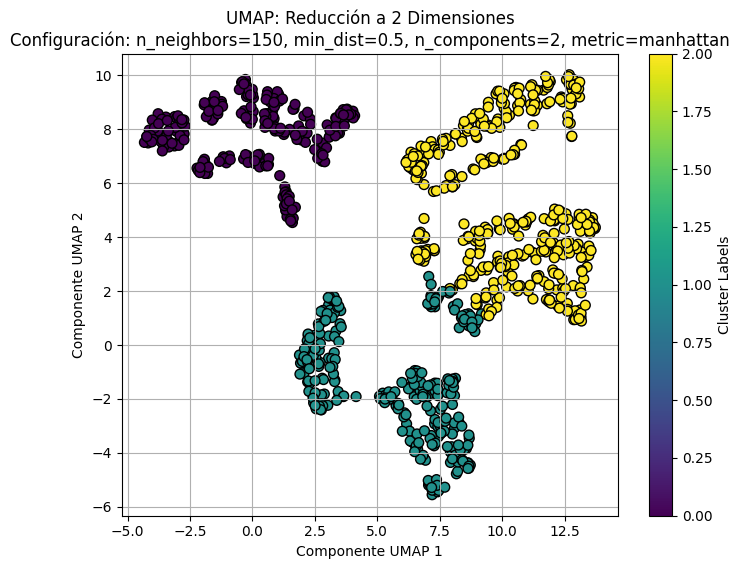

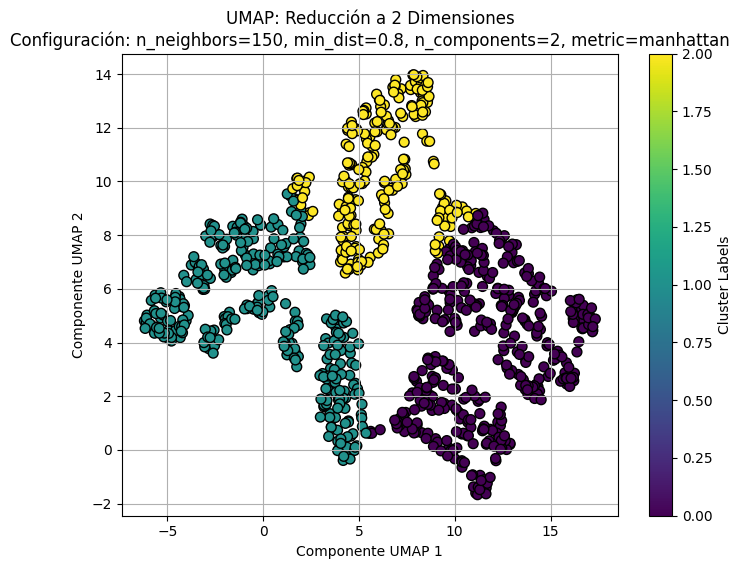

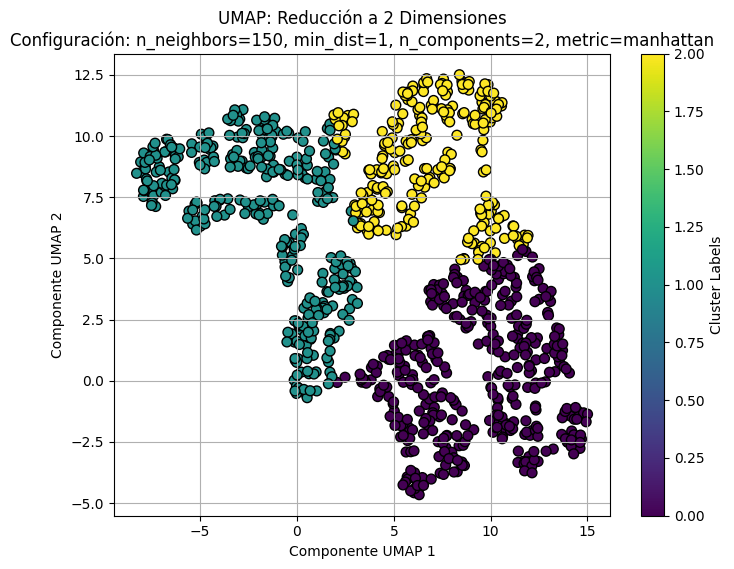

In [ ]:
import itertools
import umap
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Convertir la variable objetivo categórica a numérica
le = LabelEncoder()
y_encoded = le.fit_transform(df['CAUSA_BASICA'])

# Seleccionar las columnas especificadas para X
selected_columns = top_features
X = df[selected_columns]

# Normalizar los datos usando StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Definir las métricas a utilizar
metrics = ['euclidean', 'cosine', 'manhattan']

# Definir los valores de n_neighbors y min_dist a probar
n_neighbors_values = [50, 70, 100, 150]
min_dist_values = [0.1, 0.5, 0.8, 1]

# Iterar sobre las combinaciones de métricas, n_neighbors y min_dist
for metric in metrics:
    for n_neighbors in n_neighbors_values:
        for min_dist in min_dist_values:
            # Aplicar UMAP para reducir a 2 dimensiones
            umap_reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2, metric=metric)
            X_umap = umap_reducer.fit_transform(X_scaled)

            # Aplicar K-means para identificar grupos
            kmeans = KMeans(n_clusters=3, random_state=42)  # Ajusta el número de clústeres según sea necesario
            kmeans.fit(X_umap)
            labels = kmeans.labels_

            # Crear un DataFrame para los datos transformados
            umap_transformed = pd.DataFrame(X_umap, columns=['Componente UMAP 1', 'Componente UMAP 2'])

            # Visualizar en un gráfico de dispersión
            plt.figure(figsize=(8, 6))
            plt.scatter(umap_transformed['Componente UMAP 1'], umap_transformed['Componente UMAP 2'], c=labels, cmap='viridis', edgecolor='k', s=50)
            plt.title(f'UMAP: Reducción a 2 Dimensiones\nConfiguración: n_neighbors={n_neighbors}, min_dist={min_dist}, n_components=2, metric={metric}')
            plt.xlabel('Componente UMAP 1')
            plt.ylabel('Componente UMAP 2')
            plt.colorbar(label='Cluster Labels')
            plt.grid(True)
            plt.show()


Tarea 1: Identificar las zonas geográficas con mayores niveles de estrés (T1)
- Pregunta 1: ¿Cómo se pueden seleccionar de manera interactiva las regiones geográficas con mayores niveles de estrés?
- Pregunta 2: ¿Qué regiones muestran los niveles más altos de estrés en los mapas de calor?
- Pregunta 3: ¿Cómo varían estos niveles de estrés a lo largo del tiempo y qué patrones emergen en las diferentes regiones geográficas?

Tarea 2: Analizar los patrones de mortalidad por malaria según datos demográficos y geográficos (T2)
- Pregunta 1: ¿Cuáles son los patrones de muertes por malaria en relación con datos demográficos y geográficos específicos?
- Pregunta 2: ¿Cómo varían los patrones de mortalidad por malaria entre diferentes grupos de edad, género y regiones?
- Pregunta 3: ¿Dónde se encuentran los clusters más grandes de muertes por malaria?
- Pregunta 4: ¿Qué características demográficas y geográficas comparten estos clusters?
- Pregunta 5: ¿Cómo varían estos clusters a lo largo del tiempo?
- Pregunta 6: ¿Qué similitudes existen entre las muertes por malaria en diferentes regiones y entre diferentes grupos demográficos?
- Pregunta 7: ¿Qué factores geográficos y demográficos son los más influyentes en la mortalidad por malaria?

Mejores preguntas:

1. ¿Dónde se encuentran los clusters más grandes de muertes por malaria?
2. ¿Cuáles son los patrones de muertes por malaria en relación con datos demográficos y geográficos específicos?
3. ¿Cómo varían los patrones de mortalidad por malaria entre diferentes grupos de edad, género y regiones?

1. ¿Dónde se encuentran los clusters más grandes de muertes por malaria?

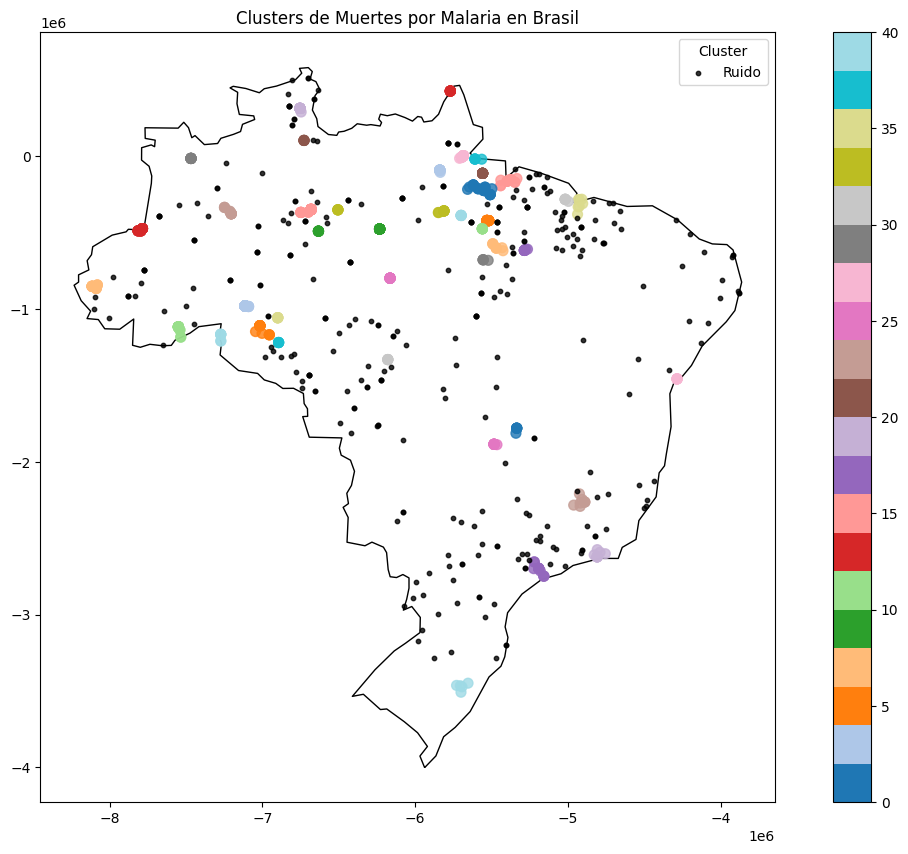

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN

# Asegurarse de que el DataFrame df tenga las columnas necesarias
# df debe tener las columnas 'LONGITUD', 'LATITUD', y 'CASOS_TOTALES'

# Crear GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.LONGITUD, df.LATITUD))

# Configurar sistema de coordenadas (CRS)
gdf.set_crs(epsg=4326, inplace=True)

# Convertir CRS a EPSG:3857 para análisis espacial
gdf = gdf.to_crs(epsg=3857)

# Aplicar el algoritmo DBSCAN para identificar clusters
# Ajustar los parámetros eps y min_samples según sea necesario
coords = gdf[['geometry']].apply(lambda row: (row.geometry.x, row.geometry.y), axis=1).tolist()
db = DBSCAN(eps=50000, min_samples=5).fit(coords)

# Añadir etiquetas de clusters al GeoDataFrame
gdf['cluster'] = db.labels_

# Cargar el shapefile de Brasil
brazil = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
brazil = brazil[(brazil.name == "Brazil")]

# Convertir CRS de Brasil a EPSG:3857 para que coincida con gdf
brazil = brazil.to_crs(epsg=3857)

# Plotear el mapa con clusters
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
brazil.plot(ax=ax, color='white', edgecolor='black')

# Plotear puntos con clusters, usando colores diferentes para cada cluster
gdf[gdf['cluster'] != -1].plot(column='cluster', ax=ax, legend=True, cmap='tab20', markersize=50, alpha=0.8)

# Añadir los puntos de ruido (aquellos no asignados a ningún cluster)
gdf[gdf['cluster'] == -1].plot(ax=ax, color='black', markersize=10, alpha=0.8, label='Ruido')

plt.title('Clusters de Muertes por Malaria en Brasil')
plt.legend(title='Cluster')
plt.show()


In [ ]:
import pandas as pd
import geopandas as gpd
import folium
from sklearn.cluster import DBSCAN
from folium.plugins import MarkerCluster

# Asegurarse de que el DataFrame df tenga las columnas necesarias
# df debe tener las columnas 'LONGITUD', 'LATITUD', y 'CASOS_TOTALES'

# Crear GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.LONGITUD, df.LATITUD))

# Configurar sistema de coordenadas (CRS)
gdf.set_crs(epsg=4326, inplace=True)

# Aplicar el algoritmo DBSCAN para identificar clusters
coords = gdf[['geometry']].apply(lambda row: (row.geometry.y, row.geometry.x), axis=1).tolist()  # Folium usa latitud, longitud
db = DBSCAN(eps=0.1, min_samples=3).fit(coords)

# Añadir etiquetas de clusters al GeoDataFrame
gdf['cluster'] = db.labels_

# Crear un mapa base
m = folium.Map(location=[-14.2350, -51.9253], zoom_start=4)

# Añadir un marcador de cluster
marker_cluster = MarkerCluster().add_to(m)

# Añadir puntos al mapa
for idx, row in gdf.iterrows():
    folium.Marker(
        location=[row['LATITUD'], row['LONGITUD']],
        popup=folium.Popup(f"Casos Totales: {row['CASOS_TOTALES']}<br>Cluster: {row['cluster']}", max_width=300),
        icon=folium.Icon(color='blue' if row['cluster'] != -1 else 'gray')
    ).add_to(marker_cluster)

# Mostrar el mapa en el notebook
m


2. ¿Cuáles son los patrones de muertes por malaria en relación con datos demográficos y geográficos específicos?

### 3 Vista de barras apiladas interactivas con la distribución de casos de mortalidad por rango de edad y sexo

In [ ]:
import plotly.express as px
import pandas as pd

# Crear un gráfico de barras apiladas para el rango de edad
fig = px.histogram(df, x='RANGO_EDAD', y='CASOS_TOTALES', color='SEXO', barmode='stack',
                   title='Patrones de Mortalidad por Malaria por Rango de Edad',
                   labels={'RANGO_EDAD': 'Rango de Edad', 'CASOS_TOTALES': 'Número de Casos Totales'})

# Agregar filtros de faceta para diferentes categorías
fig.update_layout(
    updatemenus=[
        {
            'buttons': [
                {
                    'label': 'Rango de Edad',
                    'method': 'update',
                    'args': [{'x': [df['RANGO_EDAD']], 'y': [df['CASOS_TOTALES']], 'color': [df['SEXO']]},
                             {'title': 'Patrones de Mortalidad por Malaria según Rango de Edad'}]
                },
                {
                    'label': 'Género',
                    'method': 'update',
                    'args': [{'x': [df['SEXO']], 'y': [df['CASOS_TOTALES']], 'color': [df['RANGO_EDAD']]},
                             {'title': 'Patrones de Mortalidad por Malaria según Género'}]
                },
                {
                    'label': 'Región',
                    'method': 'update',
                    'args': [{'x': [df['ESTADO_RESIDENCIA']], 'y': [df['CASOS_TOTALES']], 'color': [df['RANGO_EDAD']]},
                             {'title': 'Patrones de Mortalidad por Malaria según Estado de Residencia'}]
                }
            ],
            'direction': 'down',
            'showactive': True,
        }
    ]
)

fig.show()


3. ¿Cómo varían los patrones de mortalidad por malaria entre diferentes grupos de edad, género y regiones?

In [ ]:
import folium
from folium.plugins import MarkerCluster
import pandas as pd

# Crear un mapa base
m = folium.Map(location=[-14.2350, -51.9253], zoom_start=4)

# Añadir un marcador de cluster
marker_cluster = MarkerCluster().add_to(m)

# Añadir puntos al mapa
for idx, row in df.iterrows():
    folium.Marker(
        location=[row['LATITUD'], row['LONGITUD']],
        popup=folium.Popup(f"Rango de Edad: {row['RANGO_EDAD']}<br>Género: {row['SEXO']}<br>Casos Totales: {row['CASOS_TOTALES']}", max_width=300),
        icon=folium.Icon(color='blue' if row['SEXO'] == 'Male' else 'pink')
    ).add_to(marker_cluster)

# Mostrar mapa interactivo en un notebook
m


Tarea 3: Examinar la correlación y periodicidad de los casos de malaria en relación con los factores climáticos (T3)
- Pregunta 1: ¿Cómo han evolucionado los casos de malaria en relación con los factores climáticos a lo largo del tiempo?
- Pregunta 2: ¿Cómo se correlacionan los patrones de casos de malaria con variables climáticas como la temperatura y la humedad?
- Pregunta 3: ¿Existe una periodicidad estacional en los casos de malaria?
- Pregunta 4: ¿Cómo afectan los cambios climáticos a la incidencia de la malaria en diferentes regiones?

Pregunta 1: ¿Cómo han evolucionado los casos de malaria en relación con los factores climáticos a lo largo del tiempo?

Pregunta 2: ¿Cómo se correlacionan los patrones de casos de malaria con variables climáticas como la temperatura y la humedad?

Pregunta 3: ¿Existe una periodicidad estacional en los casos de malaria?

# Otros Graficos

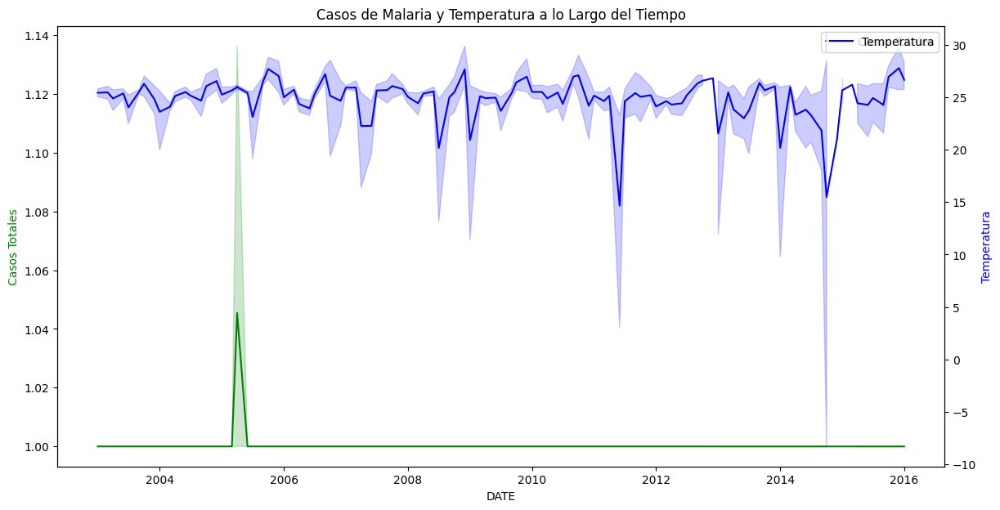

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Suponiendo que df ya está cargado

# Extraer el año y el mes de ANIO_MES
df['YEAR'] = df['ANIO_MES'].apply(lambda x: int(x))
df['MONTH'] = df['ANIO_MES'].apply(lambda x: int((x - int(x)) * 12) + 1)

# Crear una columna datetime a partir de YEAR y MONTH
df['DATE'] = pd.to_datetime(df[['YEAR', 'MONTH']].assign(DAY=1))

# Gráfico de serie temporal
fig, ax1 = plt.subplots(figsize=(14, 7))
ax2 = ax1.twinx()

sns.lineplot(data=df, x='DATE', y='CASOS_TOTALES', ax=ax1, color='g', label='Casos Totales')
sns.lineplot(data=df, x='DATE', y='TEMPERATURA', ax=ax2, color='b', label='Temperatura')

ax1.set_ylabel('Casos Totales', color='g')
ax2.set_ylabel('Temperatura', color='b')
plt.title('Casos de Malaria y Temperatura a lo Largo del Tiempo')
plt.show()


### 14 Vista de matriz de correlación de mortalidad por malaria con temperatura y humedad

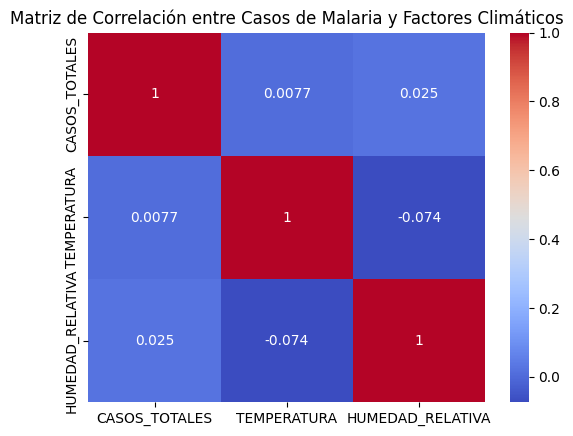

In [ ]:
# Matriz de correlación
correlation_matrix = df[['CASOS_TOTALES', 'TEMPERATURA', 'HUMEDAD_RELATIVA']].corr()

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Matriz de Correlación entre Casos de Malaria y Factores Climáticos')
plt.show()
